## Model

In [1]:
# --- 环境导入 ---
import sys
sys.path.append('/cpfs04/user/hanyujin/rule-gen/rule_tokenizer')
import torch
from modelling.sit import SiT_models
from modelling.tokenizer import SoftVQModel
from modelling.samplers import euler_sampler
from utils.model import build_tokenizer
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import ruamel.yaml as yaml
# --- 参数配置 ---
vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp007-aediff-16.yaml"
vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mirror-exp001-aediff-16/checkpoints/0040000.pt"
sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mirror-000-SiT-B-1-linear-uniform-0040000.pt/checkpoints/0120000.pt"

vq_mean = 0.23553907839716345
vq_std = 1.356034517288208

model_name = "SiT-B/1"
num_classes = 3
resolution = 64
path_type = "linear"
cfg_scale = 4.0
num_steps = 50
guidance_low = 0.0
guidance_high = 0.7

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-06 18:42:54.380703: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-06 18:42:54.395881: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743936174.412582  512687 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743936174.417480  512687 cuda_blas.cc:1407] Un

Using device: cuda


/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/modelling/modules/timm_vit/vision_transformer.py:2186: UserWarning: Overwriting vit_tiny_patch16_224 in registry with modelling.modules.timm_vit.vision_transformer.vit_tiny_patch16_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/modelling/modules/timm_vit/vision_transformer.py:2195: UserWarning: Overwriting vit_tiny_patch16_384 in registry with modelling.modules.timm_vit.vision_transformer.vit_tiny_patch16_384. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  @register_model
/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/modelling/modules/timm_vit/vision_transformer.py:2204: UserWarning: Overwriting vit_small_patch32_224 in registry with modelling.modules.timm_vit.vision_transformer.vit_small_patch32_224. This is because the name being registere

In [2]:
with open(vae_config_path, 'r') as f:
    config_args = yaml.YAML().load(f)
    dataset = config_args['dataset']
    vq_model = config_args['vq_model']

vae, vae_string_name, vae_embed_dim, dit_input_size, _, _, vae_1d = build_tokenizer(vae_config_path, vae_ckpt_path)
vae = vae.to(device).eval()
print(f"Loaded VAE: embed_dim={vae_embed_dim}, input_size={dit_input_size}, 1d={vae_1d}")


<All keys matched successfully>
Loaded VAE: embed_dim=32, input_size=16, 1d=False


In [3]:
block_kwargs = {"fused_attn": False, "flash_attn": True, "qk_norm": False}
model = SiT_models[model_name](
    in_channels=vae_embed_dim,
    input_size=dit_input_size,
    num_classes=num_classes,
    use_cfg=True,
    z_dims=[0],
    vae_1d=vae_1d,
    **block_kwargs,
)
state_dict = torch.load(sit_ckpt_path, map_location=device)['ema']
model.load_state_dict(state_dict, strict=False)
model = model.to(device).eval()
print("Loaded SiT model.")

Loaded SiT model.


In [26]:
import random
seed = 12345
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

n = 1  # batch size = 1
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)

sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)

with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化

    # 准备 decoder 的初始噪声
    xT = torch.randn(n, 3, resolution, resolution, device=quant.device)

    B, C, H, W = quant.shape  
    quant = quant.view(B, C, H * W).permute(0, 2, 1)

    sampling_kwargs_img = dict(
        model=vae.decoder,
        latents=xT,
        y=quant,
        num_steps=num_steps,
        heun=False,
        cfg_scale=1,
        guidance_low=guidance_low,
        guidance_high=guidance_high,
        path_type=path_type,
        num_classes=num_classes
    )
    samples = euler_sampler(**sampling_kwargs_img).to(torch.float32)

samples = torch.clamp((samples + 1) / 2, 0, 1)  # [-1, 1] → [0, 1]
samples_np = samples[0].permute(1, 2, 0).cpu().numpy()

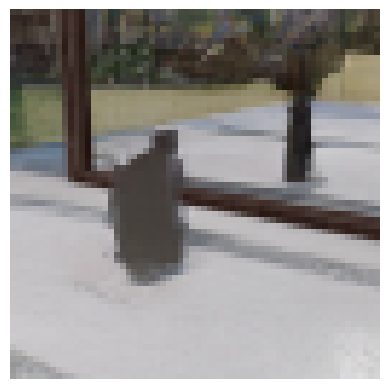

In [27]:
plt.imshow(samples_np)
plt.axis("off")
# plt.title("Generated Image")
plt.savefig("/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png")
plt.show()


## MLLM Score

In [1]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoTokenizer, AutoProcessor,Qwen2VLForConditionalGeneration
# from transformers import AutoProcessor,Qwen2VLForConditionalGeneration
import numpy as np
from qwen_vl_utils import process_vision_info

local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/Qwen2.5-VL-7B-Instruct"

model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    local_path, torch_dtype="auto", device_map="auto"
)

# local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/QVQ-72B-Preview"

# mllm_model = Qwen2VLForConditionalGeneration.from_pretrained(
#     local_path, torch_dtype="auto", device_map="auto"
# )

processor = AutoProcessor.from_pretrained(local_path)

/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-09 13:53:00.336742: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-09 13:53:00.569578: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744177980.654967 4003938 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744177980.676680 4003938 cuda_blas.cc:1407] Un

In [2]:
import re
def evaluate_image(image_path,image_size,model) -> str:
    """
    Evaluates the given image for internal visual consistency and returns a score.
    
    The evaluation is performed by prompting the model with a message asking to rate the image
    from 0 (inconsistent) to 10 (completely harmonious and consistent), following the format:
    "The score is {your_score}. The reason is {your_reason}."
    
    Args:
        image_path (str): The path to the image.
    
    Returns:
        str: The generated output text containing the score and the reason.
    """
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
                {"type": "text", "text": (
                "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
                "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
                "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
                # "What is your score?"
                )},
            ],
        }
    ]

    # Preparation for inference
    text = processor.apply_chat_template(
        messages, tokenize=False, add_generation_prompt=True
    )
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt",
    )
    inputs = inputs.to("cuda")

    # Inference: Generation of the output
    generated_ids = model.generate(**inputs, max_new_tokens=9000)
    generated_ids_trimmed = [
        out_ids[len(in_ids) :] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
    ]
    output_text = processor.batch_decode(
        generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
    )
    print("output_text:",output_text)
    pattern = r"The score is (\d+)"
    match = re.search(pattern, output_text[0])
    if match:
        return int(match.group(1))
    else:
        return extract_score_after_final_answer(output_text)

import re

def extract_score_after_final_answer(output_text):
    """
    从给定文本中查找 **Final Answer** 后面出现的第一个数字，并返回其整数值。
    如果未找到，则抛出 ValueError。
    """
    # 若 output_text 是列表，则默认取第一个元素
    if isinstance(output_text, list):
        text_to_search = output_text[0]
    else:
        text_to_search = output_text

    # 正则：匹配 "**Final Answer**" 后，任意字符(含换行)，再遇到数字(\d+)
    pattern = r"\*\*Final Answer\*\*.*?(\d+)"
    match = re.search(pattern, text_to_search, re.DOTALL)

    if match:
        return int(match.group(1))
    else:
        raise ValueError(f"No number found after **Final Answer** in: {text_to_search}")


In [6]:
image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
scores = evaluate_image(image_path,image_size,mllm_model)
print(scores)

output_text: ["The score is 0. The reason is that the reflection in the mirror does not match the object's contour, shape, or spatial alignment. The object appears to be a bottle, but its reflection looks distorted and inconsistent with the actual object's features."]
0


## MLLM Adjust

### Ori 

In [5]:
import random
seed = 12345
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
n = 1  # batch size = 1
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)

sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)

with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化


In [13]:
with torch.no_grad():

    # 准备 decoder 的初始噪声
    xT = torch.randn(n, 3, resolution, resolution, device=quant.device)

    B, C, H, W = quant.shape  
    quant = quant.view(B, C, H * W).permute(0, 2, 1)

    sampling_kwargs_img = dict(
        model=vae.decoder,
        latents=xT,
        y=quant,
        num_steps=num_steps,
        heun=False,
        cfg_scale=1,
        guidance_low=guidance_low,
        guidance_high=guidance_high,
        path_type=path_type,
        num_classes=num_classes
    )
    samples = euler_sampler(**sampling_kwargs_img).to(torch.float32)

samples = torch.clamp((samples + 1) / 2, 0, 1)  # [-1, 1] → [0, 1]
samples_np = samples[0].permute(1, 2, 0).cpu().numpy()

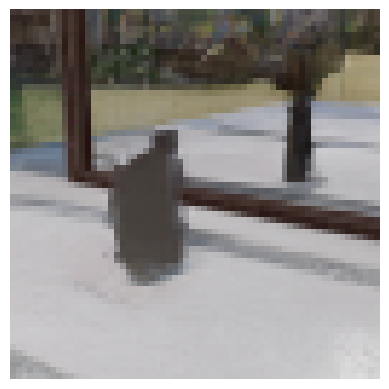

In [14]:
plt.imshow(samples_np)
plt.axis("off")
# plt.title("Generated Image")
plt.show()

In [12]:
def euler_sampler_diff(
        model,
        latents,
        y,
        num_steps=20,
        heun=False,
        cfg_scale=1.0,
        guidance_low=0.0,
        guidance_high=1.0,
        path_type="linear",
        num_classes=1000,
        return_intermediates=False  # 新增参数，决定是否返回中间结果
    ):
    xts = []
    x0_preds = []

    if cfg_scale > 1.0:
        y_null = torch.tensor([num_classes] * y.size(0), device=y.device)
    _dtype = latents.dtype    
    t_steps = torch.linspace(1, 0, num_steps+1, dtype=torch.float64)
    x_next = latents.to(torch.float64)
    device = x_next.device

    with torch.no_grad():
        for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
            x_cur = x_next
            if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                model_input = torch.cat([x_cur] * 2, dim=0)
                y_cur = torch.cat([y, y_null], dim=0)
            else:
                model_input = x_cur
                y_cur = y            
            kwargs = dict(y=y_cur)
            time_input = torch.ones(model_input.size(0)).to(device=device, dtype=torch.float64) * t_cur
            # print("model_input:",model_input.shape)
            # 当前步的 d(x)
            d_cur = model(
                model_input.to(dtype=_dtype), time_input.to(dtype=_dtype), **kwargs
            )[0].to(torch.float64)

            if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                d_cur_cond, d_cur_uncond = d_cur.chunk(2)
                d_cur = d_cur_uncond + cfg_scale * (d_cur_cond - d_cur_uncond)

            # 当前的 x_0 预测值
            x0_pred = x_cur - t_cur * d_cur
            if return_intermediates:
                xts.append(x_cur.detach().clone().to(torch.float32))
                x0_preds.append(x0_pred.detach().clone().to(torch.float32))

            x_next = x_cur + (t_next - t_cur) * d_cur

            # Heun 修正项
            if heun and (i < num_steps - 1):
                if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                    model_input = torch.cat([x_next] * 2)
                    y_cur = torch.cat([y, y_null], dim=0)
                else:
                    model_input = x_next
                    y_cur = y
                kwargs = dict(y=y_cur)
                time_input = torch.ones(model_input.size(0)).to(
                    device=model_input.device, dtype=torch.float64
                ) * t_next
                d_prime = model(
                    model_input.to(dtype=_dtype), time_input.to(dtype=_dtype), **kwargs
                )[0].to(torch.float64)
                if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                    d_prime_cond, d_prime_uncond = d_prime.chunk(2)
                    d_prime = d_prime_uncond + cfg_scale * (d_prime_cond - d_prime_uncond)
                x_next = x_cur + (t_next - t_cur) * (0.5 * d_cur + 0.5 * d_prime)

    if return_intermediates:
        return x_next, xts, x0_preds
    return x_next

In [13]:
import random
seed = 12345
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
n = 1  # batch size = 1
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)

sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)

with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化


In [14]:
xT = torch.randn(n, 3, resolution, resolution, device=quant.device)
B, C, H, W = quant.shape  
quant = quant.view(B, C, H * W).permute(0, 2, 1) 
samples, xts, x0_preds = euler_sampler_diff(
    model=vae.decoder,
    latents=xT,
    y=quant,
    num_steps=50,
    heun=False,
    cfg_scale=1,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes,
    return_intermediates=True
)


In [15]:
xts[0].shape

torch.Size([1, 3, 64, 64])

In [49]:
x0_preds[0].shape

torch.Size([1, 3, 64, 64])

In [39]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import os

os.makedirs("/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/sampling_steps", exist_ok=True)

for i, (xt, x0_pred) in enumerate(zip(xts, x0_preds)):
    # 只画第一个 batch 样本
    xt_img = TF.to_pil_image(torch.clamp((xt[0] + 1) / 2, 0, 1))
    x0_img = TF.to_pil_image(torch.clamp((x0_pred[0] + 1) / 2, 0, 1))

    fig, axs = plt.subplots(1, 2, figsize=(4, 2))
    axs[0].imshow(xt_img)
    axs[0].set_title(f"x_t @ step {i}")
    axs[0].axis('off')
    axs[1].imshow(x0_img)
    axs[1].set_title(f"x_0 pred")
    axs[1].axis('off')
    fig.tight_layout()
    fig.savefig(f"/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/sampling_steps/step_{i:02d}.png")
    plt.close(fig)


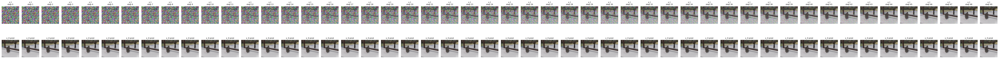

In [16]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

# 图像个数
num_steps = len(xts)
fig, axs = plt.subplots(2, num_steps, figsize=(num_steps * 1.2, 2.5 * 2))

for i in range(num_steps):
    xt_img = TF.to_pil_image(torch.clamp((xts[i][0] + 1) / 2, 0, 1))
    x0_img = TF.to_pil_image(torch.clamp((x0_preds[i][0] + 1) / 2, 0, 1))
    
    axs[0, i].imshow(xt_img)
    axs[0, i].set_title(f"x_t\nstep {i}", fontsize=8)
    axs[0, i].axis('off')

    axs[1, i].imshow(x0_img)
    axs[1, i].set_title("x_0 pred", fontsize=8)
    axs[1, i].axis('off')

plt.tight_layout()
plt.show()


In [48]:
from PIL import Image
import torchvision.transforms.functional as TF
import os

# 输出目录
save_dir = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/sampling_steps"
os.makedirs(save_dir, exist_ok=True)

xt_frames = []
x0_frames = []

for xt, x0_pred in zip(xts, x0_preds):
    # 只处理第一个 batch 样本
    xt_img = TF.to_pil_image(torch.clamp((xt[0] + 1) / 2, 0, 1))
    x0_img = TF.to_pil_image(torch.clamp((x0_pred[0] + 1) / 2, 0, 1))
    xt_frames.append(xt_img)
    x0_frames.append(x0_img)

# 保存 GIF 动图
xt_gif_path = os.path.join(save_dir, "xt_animation.gif")
x0_gif_path = os.path.join(save_dir, "x0_pred_animation.gif")

xt_frames[0].save(
    xt_gif_path,
    save_all=True,
    append_images=xt_frames[1:],
    duration=200,
    loop=0
)

x0_frames[0].save(
    x0_gif_path,
    save_all=True,
    append_images=x0_frames[1:],
    duration=200,
    loop=0
)


# Qwen- guidance

In [2]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoTokenizer, AutoProcessor,Qwen2VLForConditionalGeneration
# from transformers import AutoProcessor,Qwen2VLForConditionalGeneration
import numpy as np
from qwen_vl_utils import process_vision_info

local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/Qwen2.5-VL-7B-Instruct"

mllm_model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    local_path, torch_dtype="auto", device_map="auto"
)

# local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/QVQ-72B-Preview"

# mllm_model = Qwen2VLForConditionalGeneration.from_pretrained(
#     local_path, torch_dtype="auto", device_map="auto"
# )

processor = AutoProcessor.from_pretrained(local_path)

2025-04-09 17:28:07.470990: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-09 17:28:07.484906: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744190887.500937 3115497 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744190887.505572 3115497 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1744190887.518240 3115497 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [29]:
# # Normalized
# import torch
# import torch.nn as nn
# import matplotlib.pyplot as plt
# import numpy as np
# from scipy.ndimage import zoom
# import re
# from transformers import AutoTokenizer

# image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
# image_size = 256
# messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
#             {"type": "text", "text": (
#             "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
#             )},
#         ],
#     }
# ]

# # Preparation for inference
# text = processor.apply_chat_template(
#     messages, tokenize=False, add_generation_prompt=True
# )
# image_inputs, video_inputs = process_vision_info(messages)
# inputs = processor(
#     text=[text],
#     images=image_inputs,
#     videos=video_inputs,
#     padding=True,
#     return_tensors="pt",
# )
# inputs = inputs.to("cuda")


In [7]:
# for name, module in mllm_model.named_modules():
#     if 'vision' in name.lower() or 'image' in name.lower() or 'patch' in name.lower():
#         print(f"{name} : {module.__class__.__name__}")

# print("===== Visual Backbone Parameters =====")
# for name, module in mllm_model.named_modules():
#     if hasattr(module, 'patch_size'):
#         print(f"{name}.patch_size = {module.patch_size}")
#     if hasattr(module, 'image_size'):
#         print(f"{name}.image_size = {module.image_size}")
#     if hasattr(module, 'embed_dim'):
#         print(f"{name}.embed_dim = {module.embed_dim}")

# for name, module in mllm_model.named_modules():
#     if 'projector' in name:
#         print(f"{name}: {module}")
# print(processor)

### Pure grads

In [3]:
# Normalized 
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
import re
from transformers import AutoTokenizer

# image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
# image_size = 128
# messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
#             {"type": "text", "text": (
#             "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             # "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
#             "What is your score?"
#             )},
#         ],
#     }
# ]

image_path = "/cpfs04/user/hanyujin/rule-gen/experiments/samples/AE-JEPA-Diff-16-mnist-mnist-seq-SiT-B-1-linear-vae0001500.pt-size-64cfg-4.0-seed-0-mode-ode_smc/000000.png"
# image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image_path,
                "resized_height": image_size,
                "resized_width": image_size
            },
            {
                "type": "text",
                "text": (
                    "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                    "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                    "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                    "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
                    "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
                    "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
                    "Please answer in the format: The reason is {{your_reason}}. The score is {{your_score}}."
                )
            }
        ],
    }
]

# Preparation for inference
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")


# ✅ 4. 启用梯度计算，重新 forward 计算 logits
inputs['pixel_values'].requires_grad = True  # 重新启用梯度

In [4]:
# 拿最后一个 token 的预测 ID
zero_logit = mllm_model(**inputs, output_hidden_states=False).logits[:, -1, :]
last_token_id = zero_logit.argmax(dim=-1)  # shape: [B]

# 解码成 token（字符串）
last_token_str = processor.tokenizer.batch_decode(last_token_id.unsqueeze(0))
print("📌 最后一个 token 是：", last_token_str[0])


📌 最后一个 token 是： The


In [5]:
# Normalized 
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
import re
from transformers import AutoTokenizer

# image_path = "/cpfs04/user/hanyujin/rule-gen/datasets/mirrors_train/left/00002.png"
# # "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
# image_size = 128
# messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
#             {"type": "text", "text": (
#             "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             # "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
#             "What is your score?"
#             )},
#         ],
#     }
# ]

# Preparation for inference
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")


# ✅ 4. 启用梯度计算，重新 forward 计算 logits
inputs['pixel_values'].requires_grad = True  # 重新启用梯度
# 启用梯度计算，重新获取 logits 计算梯度
# input_len = inputs['input_ids'].shape[1]
# logits = mllm_model(**inputs, output_hidden_states=False).logits
# zero_logit = logits[:, input_len, :]  # 取第一个生成 token 的 logits
zero_logit = mllm_model(**inputs, output_hidden_states=False).logits[:, -1, :]
true_class = torch.argmax(zero_logit, dim=1)

# 计算 CrossEntropy Loss
criterion = nn.CrossEntropyLoss()
loss = -criterion(zero_logit, true_class)

# 计算 grads
grads = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]
print(f"Grads shape: {grads.shape}")  # 应该是 [324, 1176] 或其他

# 重新 reshape grads
token_grid_size = int(np.sqrt(grads.shape[0]))  # 计算 token grid 的大小
grads = grads[:token_grid_size**2, :].view(token_grid_size, token_grid_size, -1)
print(f"Reshaped grads shape: {grads.shape}")  # [18, 18, 1176]

# 计算 grads 的范数
grad_norm = torch.norm(grads, dim=-1).detach().cpu().numpy()
print(f"Grad norm shape: {grad_norm.shape}")  # [18, 18]

## General
general_messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
            {"type": "text", "text": (
                "Write a general description of the image."
            )},
        ],
    }
]

# Preparation for inference
general_text = processor.apply_chat_template(
    general_messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(general_messages)
general_inputs = processor(
    text=[general_text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
general_inputs = general_inputs.to("cuda")

general_inputs['pixel_values'].requires_grad = True  # 重新启用梯度
# 启用梯度计算，重新获取 logits 计算梯度
# general_input_len = general_inputs['input_ids'].shape[1]
# general_logits = mllm_model(**general_inputs, output_hidden_states=False).logits
# general_zero_logit = general_logits[:, general_input_len, :]  # 取第一个生成 token 的 logits
general_zero_logit = mllm_model(**general_inputs, output_hidden_states=False).logits[:, -1, :]
general_true_class = torch.argmax(general_zero_logit, dim=1)
print("general_true_class:",general_true_class)
general_loss = -criterion(general_zero_logit, general_true_class)

# 计算 grads
general_grads = torch.autograd.grad(general_loss, general_inputs['pixel_values'], retain_graph=True)[0]
print(f"Grads shape: {general_grads.shape}")  # 应该是 [324, 1176] 或其他

# 重新 reshape grads
general_token_grid_size = int(np.sqrt(general_grads.shape[0]))  # 计算 token grid 的大小
general_grads = general_grads[:general_token_grid_size**2, :].view(general_token_grid_size, general_token_grid_size, -1)
print(f"General Reshaped grads shape: {general_grads.shape}")  # [18, 18, 1176]

# 计算 grads 的范数
general_grad_norm = torch.norm(general_grads, dim=-1).detach().cpu().numpy()
print(f"General Grad norm shape: {general_grad_norm.shape}")  # [18, 18]

grad_norm_norm = grad_norm / general_grad_norm

Grads shape: torch.Size([100, 1176])
Reshaped grads shape: torch.Size([10, 10, 1176])
Grad norm shape: (10, 10)
general_true_class: tensor([785], device='cuda:0')
Grads shape: torch.Size([100, 1176])
General Reshaped grads shape: torch.Size([10, 10, 1176])
General Grad norm shape: (10, 10)


In [6]:
def visualize_token_grads_from_heatmap(grad_norm_map, image_size=(64, 64), title="Token Grad Ratio Heatmap"):
    """
    grad_norm_map: torch.Tensor or np.ndarray of shape [H, W]
    This function assumes you have already computed the token-level heatmap (e.g., grad_norm / general_grad_norm)
    and just want to upsample + visualize it.
    """
    import torch
    import torch.nn.functional as F
    import matplotlib.pyplot as plt

    # Ensure tensor
    if isinstance(grad_norm_map, np.ndarray):
        grad_norm_map = torch.from_numpy(grad_norm_map)

    grad_norm_map = grad_norm_map.float().unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]

    # Interpolate to image size
    grad_interp = F.interpolate(grad_norm_map, size=image_size, mode='bilinear', align_corners=False)

    # 可视化
    plt.imshow(grad_interp[0, 0].cpu().numpy(), cmap='viridis')
    plt.title(title)
    plt.colorbar()
    plt.axis('off')
    plt.show()

    return grad_interp  # shape: [1, 1, H, W]


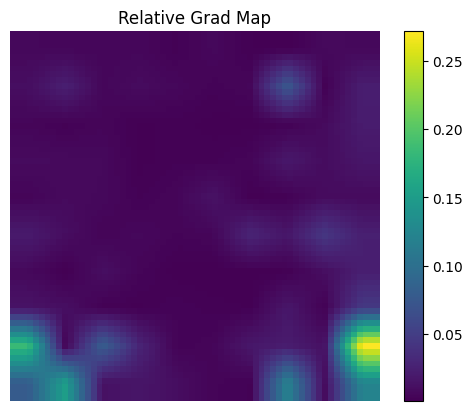

tensor([[[[0.0065, 0.0065, 0.0065,  ..., 0.0070, 0.0070, 0.0070],
          [0.0065, 0.0065, 0.0065,  ..., 0.0070, 0.0070, 0.0070],
          [0.0065, 0.0065, 0.0065,  ..., 0.0070, 0.0070, 0.0070],
          ...,
          [0.0786, 0.0786, 0.0786,  ..., 0.1223, 0.1223, 0.1223],
          [0.0786, 0.0786, 0.0786,  ..., 0.1223, 0.1223, 0.1223],
          [0.0786, 0.0786, 0.0786,  ..., 0.1223, 0.1223, 0.1223]]]])

In [8]:
visualize_token_grads_from_heatmap( grad_norm, image_size=(64, 64), title="Relative Grad Map")

## Attned-grads

In [133]:
# Normalized 
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
import re
from transformers import AutoTokenizer

image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
            {"type": "text", "text": (
            "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
            )},
        ],
    }
]

# Preparation for inference
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")


# ✅ 4. 启用梯度计算，重新 forward 计算 logits
inputs['pixel_values'].requires_grad = True  # 重新启用梯度
# 启用梯度计算，重新获取 logits 计算梯度
zero_logit = mllm_model(**inputs, output_hidden_states=False).logits[:, -1, :]
true_class = torch.argmax(zero_logit, dim=1)

# 计算 CrossEntropy Loss
criterion = nn.CrossEntropyLoss()
loss = -criterion(zero_logit, true_class)

# 计算 grads
grads = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]
print(f"Grads shape: {grads.shape}")  # 应该是 [324, 1176] 或其他

# 重新 reshape grads
# token_grid_size = int(np.sqrt(grads.shape[0]))  # 计算 token grid 的大小
# grads = grads[:token_grid_size**2, :].view(token_grid_size, token_grid_size, -1)
# print(f"Reshaped grads shape: {grads.shape}")  # [18, 18, 1176]

# # 计算 grads 的范数
# grad_norm = torch.norm(grads, dim=-1).detach().cpu().numpy()
# print(f"Grad norm shape: {grad_norm.shape}")  # [18, 18]

# ## General
# general_messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
#             {"type": "text", "text": (
#                 "Write a general description of the image."
#             )},
#         ],
#     }
# ]

# # Preparation for inference
# general_text = processor.apply_chat_template(
#     general_messages, tokenize=False, add_generation_prompt=True
# )
# image_inputs, video_inputs = process_vision_info(general_messages)
# general_inputs = processor(
#     text=[general_text],
#     images=image_inputs,
#     videos=video_inputs,
#     padding=True,
#     return_tensors="pt",
# )
# general_inputs = general_inputs.to("cuda")

# general_inputs['pixel_values'].requires_grad = True  # 重新启用梯度
# # 启用梯度计算，重新获取 logits 计算梯度
# general_zero_logit = mllm_model(**general_inputs, output_hidden_states=False).logits[:, -1, :]
# general_true_class = torch.argmax(general_zero_logit, dim=1)
# print("general_true_class:",general_true_class)
# general_loss = -criterion(general_zero_logit, general_true_class)

# # 计算 grads
# general_grads = torch.autograd.grad(general_loss, general_inputs['pixel_values'], retain_graph=True)[0]
# print(f"Grads shape: {general_grads.shape}")  # 应该是 [324, 1176] 或其他

# # 重新 reshape grads
# general_token_grid_size = int(np.sqrt(general_grads.shape[0]))  # 计算 token grid 的大小
# general_grads = general_grads[:general_token_grid_size**2, :].view(general_token_grid_size, general_token_grid_size, -1)
# print(f"General Reshaped grads shape: {general_grads.shape}")  # [18, 18, 1176]

# # 计算 grads 的范数
# general_grad_norm = torch.norm(general_grads, dim=-1).detach().cpu().numpy()
# print(f"General Grad norm shape: {general_grad_norm.shape}")  # [18, 18]

# grad_norm_norm = grad_norm / general_grad_norm

Grads shape: torch.Size([100, 1176])


In [137]:
outputs = mllm_model(**inputs, output_attentions=True)
CE = nn.CrossEntropyLoss()
zero_logit = outputs.logits[:, -1, :]  # 只取最后一个 token 的输出
true_class = torch.argmax(zero_logit, dim=1)
loss = -CE(zero_logit, true_class)

Qwen2VLModel is using Qwen2VLSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [139]:
import torch.nn.functional as F
ATT_LAYER = 14
attention = outputs.attentions[ATT_LAYER]
grads = torch.autograd.grad(loss, attention, retain_graph=True)
grad_att = attention * F.relu(grads[0])

In [141]:
grad_att.shape

torch.Size([1, 64, 213, 213])

In [ ]:
att_map = grad_att[0, :, -1, pos:pos+NUM_IMG_TOKENS].mean(dim=0).to(torch.float32).detach().cpu().numpy().reshape(NUM_PATCHES, NUM_PATCHES)

### Score head

In [61]:
def visualize_token_grads(grads, image_size=(64, 64), title="Token Grad Heatmap"):
    """
    grads: [N_tokens, D]
    """
    import torch.nn.functional as F
    import matplotlib.pyplot as plt

    num_tokens = grads.shape[0]
    token_grid = int(np.sqrt(num_tokens))
    
    # 自动截断到最小正方形
    usable_tokens = token_grid * token_grid
    grads = grads[:usable_tokens]  # 忽略最后几个 token
    grads = grads.view(token_grid, token_grid, -1)

    grad_norm = grads.norm(dim=-1).unsqueeze(0).unsqueeze(0)  # shape [1, 1, H, W]
    grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)

    # 可视化
    plt.imshow(grad_interp[0, 0].cpu().detach().numpy(), cmap='viridis')
    plt.title(title)
    plt.colorbar()
    plt.axis('off')
    plt.show()

    return grad_interp  # shape: [1, 1, H, W]

In [3]:
# Normalized
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
import re
from transformers import AutoTokenizer

image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
            {"type": "text", "text": (
            "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
            )},
        ],
    }
]

# Preparation for inference
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")


# Normalized 
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
import re
from transformers import AutoTokenizer
image_path = "/cpfs04/user/hanyujin/rule-gen/experiments/samples/AE-JEPA-Diff-16-mnist-mnist-seq-SiT-B-1-linear-vae0001500.pt-size-64cfg-4.0-seed-0-mode-ode_smc/000000.png"
# image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image_path,
                "resized_height": image_size,
                "resized_width": image_size
            },
            {
                "type": "text",
                "text": (
                    "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                    "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                    "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                    "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
                    "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
                    "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
                    "Please answer in the format: The reason is {{your_reason}}. The score is {{your_score}}."
                )
            }
        ],
    }
]
# messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
#             {"type": "text", "text": (
#             "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
#             )},
#         ],
#     }
# ]

# Preparation for inference
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")


## General
general_messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
            {"type": "text", "text": (
                "Write a general description of the image."
            )},
        ],
    }
]

# Preparation for inference
general_text = processor.apply_chat_template(
    general_messages, tokenize=False, add_generation_prompt=True
)
# ✅ 正确使用 general_messages
general_image_inputs, general_video_inputs = process_vision_info(general_messages)

general_inputs = processor(
    text=[general_text],
    images=general_image_inputs,
    videos=general_video_inputs,
    padding=True,
    return_tensors="pt",
)
general_inputs = general_inputs.to("cuda")

(100, 100)


(-0.5, 99.5, 99.5, -0.5)

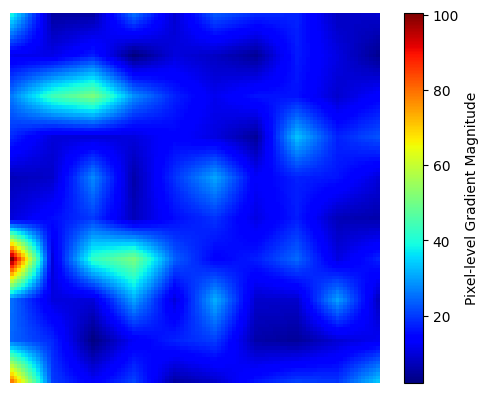

In [11]:
print(grad_image.shape)
plt.imshow(grad_image, cmap='jet')
plt.colorbar(label="Pixel-level Gradient Magnitude")
plt.axis('off')

(100, 100)


(-0.5, 99.5, 99.5, -0.5)

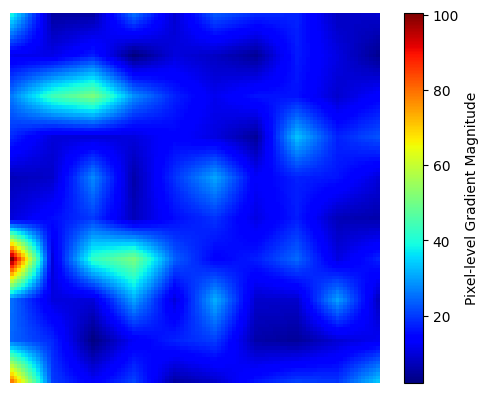

In [4]:
print(grad_image.shape)
plt.imshow(grad_image, cmap='jet')
plt.colorbar(label="Pixel-level Gradient Magnitude")
plt.axis('off')

# Llava

In [1]:
import requests
from PIL import Image
import torch
from transformers import AutoProcessor, LlavaForConditionalGeneration

model_id = "/nas/shared/CausaLLMs/MLLM_Models/llava-1.5-13b-hf"
model = LlavaForConditionalGeneration.from_pretrained(
    model_id, 
    torch_dtype=torch.float16, 
    low_cpu_mem_usage=True, 
).to(0)

processor = AutoProcessor.from_pretrained(model_id)

/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-06 12:04:05.416043: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-06 12:04:05.625569: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743912245.703101  775062 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743912245.725037  775062 cuda_blas.cc:1407] Un

KeyboardInterrupt: 

In [ ]:
# # Normalized
# import torch
# import torch.nn as nn
# import matplotlib.pyplot as plt
# import numpy as np
# from scipy.ndimage import zoom
# import re
# from transformers import AutoTokenizer

# image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
# image_size = 256
# messages = [
#     {
#         "role": "user",
#         "content": [
#             {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
#             {"type": "text", "text": (
#             "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
#             "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
#             )},
#         ],
#     }
# ]

# # Preparation for inference
# text = processor.apply_chat_template(
#     messages, tokenize=False, add_generation_prompt=True
# )
# image_inputs, video_inputs = process_vision_info(messages)
# inputs = processor(
#     text=[text],
#     images=image_inputs,
#     videos=video_inputs,
#     padding=True,
#     return_tensors="pt",
# )
# inputs = inputs.to("cuda")


In [ ]:
# Define a chat history and use `apply_chat_template` to get correctly formatted prompt
# Each value in "content" has to be a list of dicts with types ("text", "image") 
conversation = [
    {

      "role": "user",
      "content": [
          {"type": "text", "text": "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."},
          {"type": "image"},
        ],
    },
]
prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)

image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
raw_image = Image.open(image_path)
inputs = processor(images=raw_image, text=prompt, return_tensors='pt').to(0, torch.float16)

output = model.generate(**inputs, max_new_tokens=200, do_sample=False)
print(processor.decode(output[0][2:], skip_special_tokens=True))

# Qwen-2.5-VL

In [1]:
import math 

def calculate_plt_size(attention_layer_num):    
    num_layers = attention_layer_num
    cols = math.ceil(math.sqrt(num_layers))  
    rows = math.ceil(num_layers / cols)     
    return rows, cols

In [1]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
import torch
import matplotlib.pyplot as plt
from qwen_vl_utils import process_vision_info

device = 'cuda'
model_path = '/cpfs04/shared/CausaLLMs/HuggingfaceModels/Qwen2.5-VL-7B-Instruct'

mllm_model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
                model_path,
                torch_dtype=torch.bfloat16,
                attn_implementation="eager",
                device_map='auto',
            ).eval()
processor = AutoProcessor.from_pretrained(model_path, trust_remote_code=True, padding_side='left', use_fast=True)


/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2025-04-06 12:16:55.732406: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-06 12:16:55.746139: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743913015.761995 3257208 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743913015.766609 3257208 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1743913015.779072 3257208 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [3]:
image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
question = "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies. Please answer in the the format: The score is {your_score}. The reason is {your_reason}."

messages_query = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image_path,
            },
            {"type": "text", "text": f"{question} Answer:"},
        ],
    }
]

image_inputs, _ = process_vision_info(messages_query)

text_query = processor.apply_chat_template(
    messages_query,
    tokenize=False,
    add_generation_prompt=True
)

inputs = processor(
    text=[text_query],
    images=image_inputs,
    padding=True,
    return_tensors="pt",
).to(device)

messages_general = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image_path,
            },
            {"type": "text", "text": "Write a general description of the image. Answer:"},
        ],
    }
]

text_general = processor.apply_chat_template(
    messages_general,
    tokenize=False,
    add_generation_prompt=True
)

general_inputs = processor(
    text=[text_general],
    images=image_inputs,
    padding=True,
    return_tensors="pt",
).to(device)


In [4]:
image_inputs_aux = processor.image_processor(images=image_inputs)
output_shape = image_inputs_aux["image_grid_thw"].numpy().squeeze(0)[1:]/2
output_shape = output_shape.astype(int)

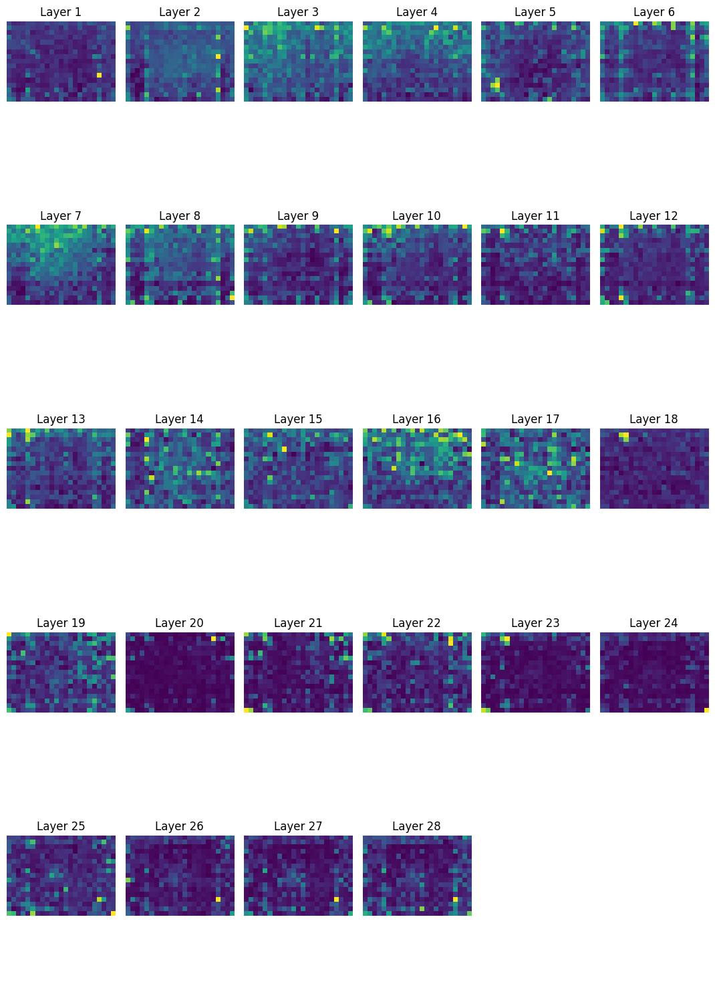

In [5]:
with torch.no_grad():
    vision_start_token_id = processor.tokenizer.convert_tokens_to_ids('<|vision_start|>')
    vision_end_token_id = processor.tokenizer.convert_tokens_to_ids('<|vision_end|>')    
    pos = inputs['input_ids'].tolist()[0].index(vision_start_token_id) + 1
    pos_end = inputs['input_ids'].tolist()[0].index(vision_end_token_id)

    output = mllm_model(**inputs, output_attentions=True)
    general_output = mllm_model(**general_inputs, output_attentions=True)
    rows, cols = calculate_plt_size(len(output.attentions))
    fig, axes = plt.subplots(rows, cols, figsize=(10.8, 16))
    for i, ax in enumerate(axes.flatten()):
        if i < len(output.attentions): 
            att = output.attentions[i][0, :, -1, pos:pos_end].mean(dim=0)
            att = att.to(torch.float32).detach().cpu().numpy()

            general_att = general_output.attentions[i][0, :, -1, pos:pos_end].mean(dim=0)
            general_att = general_att.to(torch.float32).detach().cpu().numpy()

            att = att / general_att

            ax.imshow(att.reshape(output_shape), cmap="viridis", interpolation="nearest")
            ax.set_title(f"Layer {i+1}")
            ax.axis("off")
        else:
            ax.axis("off")

    plt.tight_layout()    
    plt.show()    

In [2]:
# Normalized 
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import zoom
import re
from transformers import AutoTokenizer

image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
            {"type": "text", "text": (
            "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies."
            "Please answer in the the format: The score is {your_score}. The reason is {your_reason}."
            )},
        ],
    }
]

# Preparation for inference
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")


# ✅ 4. 启用梯度计算，重新 forward 计算 logits
inputs['pixel_values'].requires_grad = True  # 重新启用梯度
# 启用梯度计算，重新获取 logits 计算梯度
zero_logit = mllm_model(**inputs, output_hidden_states=False).logits[:, -1, :]
true_class = torch.argmax(zero_logit, dim=1)

# 计算 CrossEntropy Loss
criterion = nn.CrossEntropyLoss()
loss = -criterion(zero_logit, true_class)

# 计算 grads
grads = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]
print(f"Grads shape: {grads.shape}")  # 应该是 [324, 1176] 或其他

# 重新 reshape grads
token_grid_size = int(np.sqrt(grads.shape[0]))  # 计算 token grid 的大小
grads = grads[:token_grid_size**2, :].view(token_grid_size, token_grid_size, -1)
print(f"Reshaped grads shape: {grads.shape}")  # [18, 18, 1176]

# 计算 grads 的范数
grad_norm = torch.norm(grads, dim=-1).detach().cpu().numpy()
print(f"Grad norm shape: {grad_norm.shape}")  # [18, 18]

## General
general_messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image_path,"resized_height":image_size,"resized_width":image_size},
            {"type": "text", "text": (
                "Write a general description of the image."
            )},
        ],
    }
]

# Preparation for inference
general_text = processor.apply_chat_template(
    general_messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(general_messages)
general_inputs = processor(
    text=[general_text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
general_inputs = general_inputs.to("cuda")

general_inputs['pixel_values'].requires_grad = True  # 重新启用梯度
# 启用梯度计算，重新获取 logits 计算梯度
general_zero_logit = mllm_model(**general_inputs, output_hidden_states=False).logits[:, -1, :]
general_true_class = torch.argmax(general_zero_logit, dim=1)
print("general_true_class:",general_true_class)
general_loss = -criterion(general_zero_logit, general_true_class)

# 计算 grads
general_grads = torch.autograd.grad(general_loss, general_inputs['pixel_values'], retain_graph=True)[0]
print(f"Grads shape: {general_grads.shape}")  # 应该是 [324, 1176] 或其他

# 重新 reshape grads
general_token_grid_size = int(np.sqrt(general_grads.shape[0]))  # 计算 token grid 的大小
general_grads = general_grads[:general_token_grid_size**2, :].view(general_token_grid_size, general_token_grid_size, -1)
print(f"General Reshaped grads shape: {general_grads.shape}")  # [18, 18, 1176]

# 计算 grads 的范数
general_grad_norm = torch.norm(general_grads, dim=-1).detach().cpu().numpy()
print(f"General Grad norm shape: {general_grad_norm.shape}")  # [18, 18]

grad_norm_norm = grad_norm / general_grad_norm

Grads shape: torch.Size([100, 1176])
Reshaped grads shape: torch.Size([10, 10, 1176])
Grad norm shape: (10, 10)
general_true_class: tensor([785], device='cuda:0')
Grads shape: torch.Size([100, 1176])
General Reshaped grads shape: torch.Size([10, 10, 1176])
General Grad norm shape: (10, 10)


✅ 图像 token 数量: 25，Patch 网格大小: 5x5


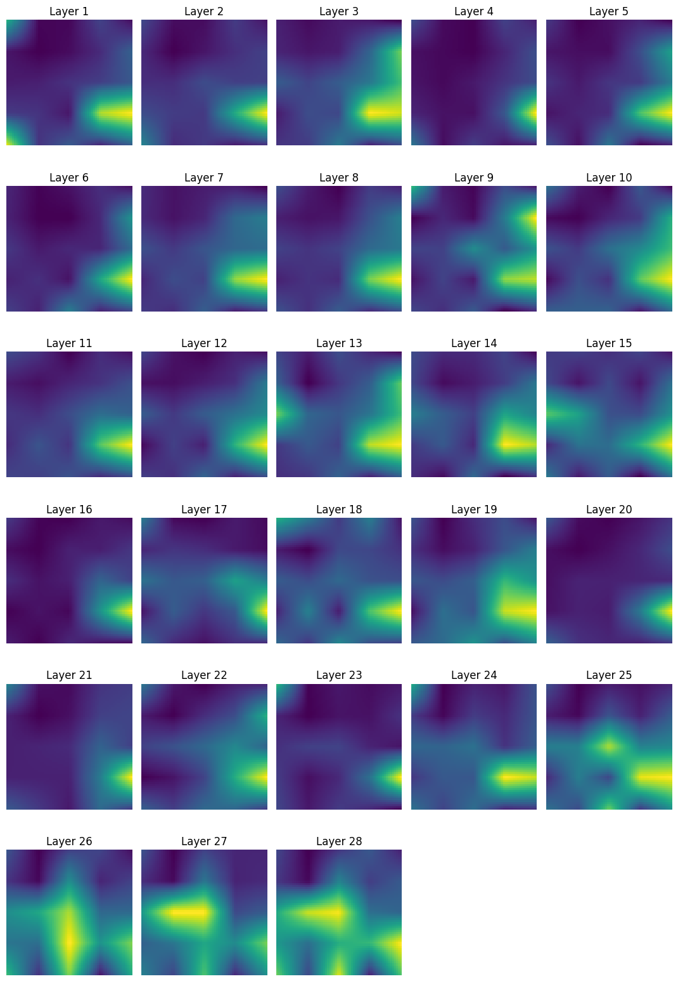

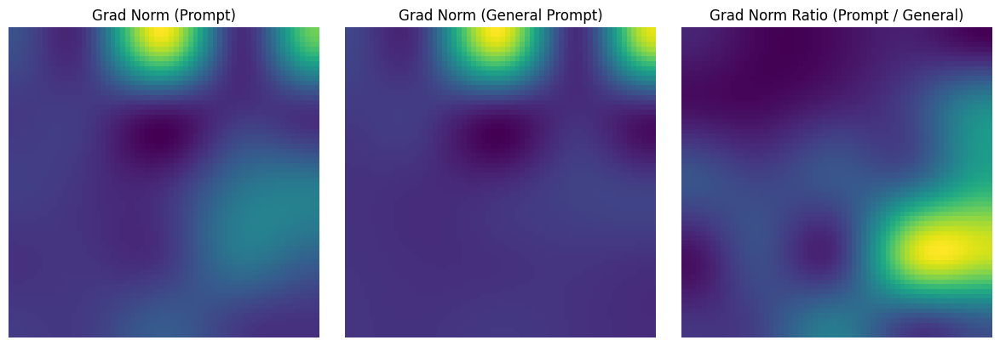

In [6]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

# 假设你已经准备好以下变量：
# model: Qwen2-VL 模型
# processor: 对应的 processor
# inputs: 带问题 prompt 的输入（包含 pixel_values）
# general_inputs: 泛化 prompt 的输入（包含 pixel_values）
# grad_norm: 对应 inputs 梯度范数 (e.g., [18, 18])
# general_grad_norm: 对应 general_inputs 梯度范数

with torch.no_grad():
    # 图像 token 的位置范围
    vision_start_token_id = processor.tokenizer.convert_tokens_to_ids('<|vision_start|>')
    vision_end_token_id = processor.tokenizer.convert_tokens_to_ids('<|vision_end|>')
    pos = inputs['input_ids'].tolist()[0].index(vision_start_token_id) + 1
    pos_end = inputs['input_ids'].tolist()[0].index(vision_end_token_id)
    num_img_tokens = pos_end - pos
    patch_grid_size = int(np.sqrt(num_img_tokens))

    print(f"✅ 图像 token 数量: {num_img_tokens}，Patch 网格大小: {patch_grid_size}x{patch_grid_size}")

    # 插值梯度范数图，调整为 patch_grid_size 大小
    grad_norm_interp = zoom(grad_norm, (patch_grid_size / grad_norm.shape[0], patch_grid_size / grad_norm.shape[1]), order=1)
    general_grad_norm_interp = zoom(general_grad_norm, (patch_grid_size / general_grad_norm.shape[0], patch_grid_size / general_grad_norm.shape[1]), order=1)
    grad_norm_ratio = grad_norm_interp / (general_grad_norm_interp + 1e-8)

    # 获取模型输出（带 attention）
    output = mllm_model(**inputs, output_attentions=True)
    general_output = mllm_model(**general_inputs, output_attentions=True)

    def calculate_plt_size(n_layers):
        rows = int(np.ceil(np.sqrt(n_layers)))
        cols = int(np.ceil(n_layers / rows))
        return rows, cols

    rows, cols = calculate_plt_size(len(output.attentions))
    fig, axes = plt.subplots(rows, cols, figsize=(10.8, 16))

    for i, ax in enumerate(axes.flatten()):
        if i < len(output.attentions):
            # 当前层的 attention (均值 over heads)，最后一个token到图像tokens的注意力
            att = output.attentions[i][0, :, -1, pos:pos_end].mean(dim=0).to(torch.float32).detach().cpu().numpy()
            general_att = general_output.attentions[i][0, :, -1, pos:pos_end].mean(dim=0).to(torch.float32).detach().cpu().numpy()

            # reshape 成 grid
            att = att.reshape(patch_grid_size, patch_grid_size)
            general_att = general_att.reshape(patch_grid_size, patch_grid_size)

            # attention 比值
            att_ratio = att / (general_att + 1e-8)

            # 融合 attention × 梯度范数比值
            weighted_att = att_ratio * grad_norm_ratio

            # 插值到 64x64
            weighted_att_64 = zoom(weighted_att, (64 / patch_grid_size, 64 / patch_grid_size), order=1)

            # 显示图像
            ax.imshow(weighted_att_64, cmap="viridis", interpolation="nearest")
            ax.set_title(f"Layer {i+1}")
            ax.axis("off")
        else:
            ax.axis("off")

    plt.tight_layout()
    plt.show()

# ✅ 显示单独的 Grad Norm 图（不乘 attention）

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# 输入 prompt 的梯度范数图
axes[0].imshow(zoom(grad_norm_interp, (64 / patch_grid_size, 64 / patch_grid_size)), cmap='viridis')
axes[0].set_title("Grad Norm (Prompt)")
axes[0].axis("off")

# 泛化 prompt 的梯度范数图
axes[1].imshow(zoom(general_grad_norm_interp, (64 / patch_grid_size, 64 / patch_grid_size)), cmap='viridis')
axes[1].set_title("Grad Norm (General Prompt)")
axes[1].axis("off")

# 比值图：Prompt / General
grad_norm_ratio_64 = zoom(grad_norm_ratio, (64 / patch_grid_size, 64 / patch_grid_size))
axes[2].imshow(grad_norm_ratio_64, cmap='viridis')
axes[2].set_title("Grad Norm Ratio (Prompt / General)")
axes[2].axis("off")

plt.tight_layout()
plt.show()


In [ ]:

pos = inputs['input_ids'][0].tolist().index(IMAGE_TOKEN_INDEX)

# Compute loss
outputs = model(**inputs, output_attentions=True)
CE = nn.CrossEntropyLoss()
zero_logit = outputs.logits[:, -1, :]
true_class = torch.argmax(zero_logit, dim=1)
loss = -CE(zero_logit, true_class)

# Compute attention and gradients
attention = outputs.attentions[ATT_LAYER]
grads = torch.autograd.grad(loss, attention, retain_graph=True)
grad_att = attention * F.relu(grads[0])

# Compute the attention maps
att_map = grad_att[0, :, -1, pos:pos+NUM_IMG_TOKENS].mean(dim=0).to(torch.float32).detach().cpu().numpy().reshape(NUM_PATCHES, NUM_PATCHES)
    

# Sampling-SMC

In [1]:
from transformers import Qwen2_5_VLForConditionalGeneration, AutoTokenizer, AutoProcessor,Qwen2VLForConditionalGeneration
# from transformers import AutoProcessor,Qwen2VLForConditionalGeneration
import numpy as np
from qwen_vl_utils import process_vision_info

local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/Qwen2.5-VL-7B-Instruct"

mllm_model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    local_path, torch_dtype="auto", device_map="auto"
)

# local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/QVQ-72B-Preview"

# mllm_model = Qwen2VLForConditionalGeneration.from_pretrained(
#     local_path, torch_dtype="auto", device_map="auto"
# )

processor = AutoProcessor.from_pretrained(local_path)

/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2025-04-07 19:16:21.345911: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-07 19:16:21.359728: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744024581.375915 2496250 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744024581.380575 2496250 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1744024581.393167 2496250 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [5]:
import re
import torch
import gc
import re
from qwen_vl_utils import process_vision_info

def mllm_score(image_input, image_size=128, model=None):
    """
    用 Qwen2.5-VL 模型对图片进行评分，返回整数分数 [0,1,2,...,10]
    """
    try:
        messages = [
            {
                "role": "user",
                "content": [
                    {
                        "type": "image",
                        "image": image_input,
                        "resized_height": image_size,
                        "resized_width": image_size
                    },
                    {
                        "type": "text",
                        "text": (
                            "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. "
                            "Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. "
                            "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). "
                            "Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies. "
                            "Please answer in the format: The score is {your_score}. The reason is {your_reason}."
                        )
                    }
                ],
            }
        ]

        # 输入预处理
        text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        image_inputs, video_inputs = process_vision_info(messages)
        inputs = processor(
            text=[text],
            images=image_inputs,
            videos=video_inputs,
            padding=True,
            return_tensors="pt"
        ).to("cuda")

        # 推理
        with torch.no_grad():
            generated_ids = model.generate(**inputs, max_new_tokens=512)
            generated_ids_trimmed = [
                out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
            ]
            output_text = processor.batch_decode(
                generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
            )

        print("output_text:", output_text)

        # 正则提取分数
        pattern1 = r"The score is (\d+)"
        pattern2 = r"\*\*Final Answer\*\*.*?(\d+)"
        for pattern in [pattern1, pattern2]:
            match = re.search(pattern, output_text[0], re.DOTALL)
            if match:
                return int(match.group(1))

        print("⚠️ Could not parse score from model output.")
        return 0  # fallback

    except Exception as e:
        print(f"⚠️ mllm_score error: {e}")
        return 0  # fallback

    finally:
        torch.cuda.empty_cache()
        gc.collect()

import re

def extract_score_after_final_answer(output_text):
    """
    从给定文本中查找 **Final Answer** 后面出现的第一个数字，并返回其整数值。
    如果未找到，则抛出 ValueError。
    """
    # 若 output_text 是列表，则默认取第一个元素
    if isinstance(output_text, list):
        text_to_search = output_text[0]
    else:
        text_to_search = output_text

    # 正则：匹配 "**Final Answer**" 后，任意字符(含换行)，再遇到数字(\d+)
    pattern = r"\*\*Final Answer\*\*.*?(\d+)"
    match = re.search(pattern, text_to_search, re.DOTALL)

    if match:
        return int(match.group(1))
    else:
        raise ValueError(f"No number found after **Final Answer** in: {text_to_search}")


In [11]:
image_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/test_img/test.png"
image_size = 128
scores = mllm_score(image_path,image_size,mllm_model)
print(scores)

output_text: ["The score is 0. The reason is that the reflection in the mirror does not match the object's contour, shape, or spatial alignment. The object appears to be a bottle, but its reflection is distorted and inconsistent with how it should appear if the mirror were reflecting it correctly. There are significant visual errors and inconsistencies in the reflection."]
0


In [12]:
def euler_sampler_diff(
        model,
        latents,
        y,
        num_steps=20,
        heun=False,
        cfg_scale=1.0,
        guidance_low=0.0,
        guidance_high=1.0,
        path_type="linear",
        num_classes=1000,
        return_intermediates=False  # 新增参数，决定是否返回中间结果
    ):
    xts = []
    x0_preds = []

    if cfg_scale > 1.0:
        y_null = torch.tensor([num_classes] * y.size(0), device=y.device)
    _dtype = latents.dtype    
    t_steps = torch.linspace(1, 0, num_steps+1, dtype=torch.float64)
    x_next = latents.to(torch.float64)
    device = x_next.device

    with torch.no_grad():
        for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
            x_cur = x_next
            if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                model_input = torch.cat([x_cur] * 2, dim=0)
                y_cur = torch.cat([y, y_null], dim=0)
            else:
                model_input = x_cur
                y_cur = y            
            kwargs = dict(y=y_cur)
            time_input = torch.ones(model_input.size(0)).to(device=device, dtype=torch.float64) * t_cur
            # print("model_input:",model_input.shape)
            # 当前步的 d(x)
            d_cur = model(
                model_input.to(dtype=_dtype), time_input.to(dtype=_dtype), **kwargs
            )[0].to(torch.float64)

            if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                d_cur_cond, d_cur_uncond = d_cur.chunk(2)
                d_cur = d_cur_uncond + cfg_scale * (d_cur_cond - d_cur_uncond)

            # 当前的 x_0 预测值
            x0_pred = x_cur - t_cur * d_cur
            if return_intermediates:
                xts.append(x_cur.detach().clone().to(torch.float32))
                x0_preds.append(x0_pred.detach().clone().to(torch.float32))

            x_next = x_cur + (t_next - t_cur) * d_cur

            # Heun 修正项
            if heun and (i < num_steps - 1):
                if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                    model_input = torch.cat([x_next] * 2)
                    y_cur = torch.cat([y, y_null], dim=0)
                else:
                    model_input = x_next
                    y_cur = y
                kwargs = dict(y=y_cur)
                time_input = torch.ones(model_input.size(0)).to(
                    device=model_input.device, dtype=torch.float64
                ) * t_next
                d_prime = model(
                    model_input.to(dtype=_dtype), time_input.to(dtype=_dtype), **kwargs
                )[0].to(torch.float64)
                if cfg_scale > 1.0 and t_cur <= guidance_high and t_cur >= guidance_low:
                    d_prime_cond, d_prime_uncond = d_prime.chunk(2)
                    d_prime = d_prime_uncond + cfg_scale * (d_prime_cond - d_prime_uncond)
                x_next = x_cur + (t_next - t_cur) * (0.5 * d_cur + 0.5 * d_prime)

    if return_intermediates:
        return x_next, xts, x0_preds
    return x_next

In [10]:
import random
seed = 12345
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
n = 5  # batch size = 1
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)

sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)

with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化
B, C, H, W = quant.shape  
quant = quant.view(B, C, H * W).permute(0, 2, 1) 

In [13]:
xT = torch.randn(n, 3, resolution, resolution, device=quant.device)
# B, C, H, W = quant.shape  
# quant = quant.view(B, C, H * W).permute(0, 2, 1) 
samples, xts, x0_preds = euler_sampler_diff(
    model=vae.decoder,
    latents=xT,
    y=quant,
    num_steps=50,
    heun=False,
    cfg_scale=1,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes,
    return_intermediates=True
)

In [17]:
xts[0].shape

torch.Size([5, 3, 64, 64])

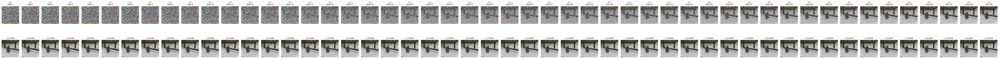

In [15]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

# 图像个数
num_steps = len(xts)
fig, axs = plt.subplots(2, num_steps, figsize=(num_steps * 1.2, 2.5 * 2))

for i in range(num_steps):
    xt_img = TF.to_pil_image(torch.clamp((xts[i][0] + 1) / 2, 0, 1))
    x0_img = TF.to_pil_image(torch.clamp((x0_preds[i][0] + 1) / 2, 0, 1))
    
    axs[0, i].imshow(xt_img)
    axs[0, i].set_title(f"x_t\nstep {i}", fontsize=8)
    axs[0, i].axis('off')

    axs[1, i].imshow(x0_img)
    axs[1, i].set_title("x_0 pred", fontsize=8)
    axs[1, i].axis('off')

plt.tight_layout()
plt.show()


In [6]:
import os
import torch
import torchvision.transforms.functional as TF
from torch.cuda.amp import autocast
import torch.nn.functional as F

def smc_guided_sampler(
    model,
    latents,
    y,
    score_fn,               # function: PIL.Image → float
    num_particles=8,
    num_steps=20,
    resample_interval=4,
    resample_beta=5.0,
    image_size=128,
    cfg_scale=1.0,
    guidance_low=0.0,
    guidance_high=1.0,
    num_classes=1000,
    init_noise_std=1e-2,
    return_intermediates=False,
    chunk_size=16
):
    xts = [[] for _ in range(num_steps)]
    x0_preds = [[] for _ in range(num_steps)]
    all_rewards = [[] for _ in range(num_steps)]  # <== 用于保存每一步的reward

    device = latents.device
    t_steps = torch.linspace(1, 0, num_steps + 1, dtype=torch.float64).to(device)
    _dtype = latents.dtype

    batch_size = latents.shape[0]
    assert y.shape[0] == batch_size, f"Mismatch: got {latents.shape[0]} latents and {y.shape[0]} conditions"

    x_particles = latents[:, None, :, :, :].repeat(1, num_particles, 1, 1, 1).reshape(batch_size * num_particles, 3, 64, 64).to(torch.float64)
    if init_noise_std > 0:
        x_particles += torch.randn_like(x_particles) * init_noise_std

    y = y[:, None, :, :].repeat(1, num_particles, 1, 1).reshape(batch_size * num_particles, y.shape[-2], y.shape[-1])

    if cfg_scale > 1.0:
        y_null = torch.zeros_like(y)

    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        print(f"\n🕓 Sampling step {i+1}/{num_steps} | t: {t_cur:.4f} → {t_next:.4f}")
        x_cur = x_particles

        if cfg_scale > 1.0 and guidance_low <= t_cur <= guidance_high:
            model_input = torch.cat([x_cur] * 2, dim=0)
            y_cur = torch.cat([y, y_null], dim=0)
        else:
            model_input = x_cur
            y_cur = y

        time_input = torch.ones(model_input.size(0), device=device, dtype=torch.float64) * t_cur

        d_cur_chunks = []
        for j in range(0, model_input.size(0), chunk_size):
            with autocast(dtype=torch.bfloat16):
                d_chunk = model(
                    model_input[j:j+chunk_size].to(dtype=_dtype),
                    time_input[j:j+chunk_size].to(dtype=_dtype),
                    y=y_cur[j:j+chunk_size]
                )[0].to(torch.float64)
            d_cur_chunks.append(d_chunk)
        d_cur = torch.cat(d_cur_chunks, dim=0)

        if cfg_scale > 1.0 and guidance_low <= t_cur <= guidance_high:
            d_cur_cond, d_cur_uncond = d_cur.chunk(2)
            d_cur = d_cur_uncond + cfg_scale * (d_cur_cond - d_cur_uncond)

        x_next = x_cur + (t_next - t_cur) * d_cur
        x0_pred = x_cur - t_cur * d_cur

        if return_intermediates:
            for p in range(x_particles.size(0)):
                xts[i].append(x_cur[p].detach().clone().to(torch.float32))
                x0_preds[i].append(x0_pred[p].detach().clone().to(torch.float32))

        if (i + 1) % resample_interval == 0 and i < num_steps - 1:
            print(f"🔍 Resampling at step {i+1} (evaluating {x_particles.size(0)} particles...)")
            images = []
            for p in range(x_particles.size(0)):
                img_np = torch.clamp((x0_pred[p] + 1) / 2, 0, 1)
                img_pil = TF.to_pil_image(img_np)
                images.append(img_pil)

            rewards = torch.tensor(
                [score_fn(img) for img in images],
                dtype=torch.float32,
                device=device
            )
            print(f"🎯 Rewards: {[round(r.item(), 2) for r in rewards]}")
            all_rewards[i] = rewards.detach().cpu().tolist()  # <== 保存 reward

            weights = F.softmax(rewards * resample_beta, dim=0)
            resample_idx = torch.multinomial(weights, x_particles.size(0), replacement=True)

            x_next = x_next[resample_idx]
            y = y[resample_idx]

            if return_intermediates:
                xts[i] = [xts[i][j] for j in resample_idx]
                x0_preds[i] = [x0_preds[i][j] for j in resample_idx]

        x_particles = x_next

    if return_intermediates:
        return x_particles, xts, x0_preds, all_rewards
    return x_particles, all_rewards


In [7]:
import random
seed = 42 #12345
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)
n = 3  # batch size = 1
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)

sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)

with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化
B, C, H, W = quant.shape  
quant = quant.view(B, C, H * W).permute(0, 2, 1) 

In [8]:
quant.shape

torch.Size([3, 256, 32])

In [8]:
from functools import partial

score_fn = partial(mllm_score, image_size=128, model=mllm_model)

xT = torch.randn(n, 3, resolution, resolution, device=quant.device)
final_latents, xts, x0_preds, all_rewards = smc_guided_sampler(
    model=vae.decoder,
    latents=xT,
    y=quant,
    score_fn=score_fn,
    num_particles=2,
    num_steps=20,
    resample_interval=5,
    resample_beta=6.0,
    init_noise_std = 0,
    return_intermediates=True
)



🕓 Sampling step 1/20 | t: 1.0000 → 0.9500

🕓 Sampling step 2/20 | t: 0.9500 → 0.9000

🕓 Sampling step 3/20 | t: 0.9000 → 0.8500

🕓 Sampling step 4/20 | t: 0.8500 → 0.8000

🕓 Sampling step 5/20 | t: 0.8000 → 0.7500
🔍 Resampling at step 5 (evaluating 6 particles...)


output_text: ["The score is 0. The reason is that there are noticeable inconsistencies between the object and its reflection. The object appears to be a small figure, possibly a toy or figurine, but the reflection does not match this description. Instead, it seems to be a distorted or incomplete reflection, lacking details and appearing as if it's not fully rendered. This suggests a significant inconsistency in the reflection, making it unrealistic."]
output_text: ["The score is 0. The reason is that there are noticeable inconsistencies between the object and its reflection. The object appears to be a small figure, possibly a toy or figurine, but the reflection does not match this description. Instead, it seems to be a distorted or incomplete reflection, lacking details and appearing as if it's not fully rendered. This suggests a significant inconsistency in the reflection, making it unrealistic."]
output_text: ['The score is 0. The reason is that there is a significant inconsistency b

In [11]:
all_rewards

[[],
 [],
 [],
 [],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [],
 [],
 [],
 [],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [],
 [],
 [],
 [],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [],
 [],
 [],
 [],
 []]

In [12]:
import os
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image

def visualize_smc_sampling_steps(
    xts, x0_preds, rewards=None, save_dir=None,
    num_samples=3, particles_per_sample=2
):
    os.makedirs(save_dir, exist_ok=True)
    num_steps = len(xts)
    total_particles = num_samples * particles_per_sample

    for step in range(num_steps):
        # 如果该步没有 reward，就跳过显示 score
        has_reward = rewards is not None and len(rewards[step]) > 0

        fig, axs = plt.subplots(num_samples, particles_per_sample * 2, figsize=(particles_per_sample * 4.5, num_samples * 2.5))

        if num_samples == 1:
            axs = axs.reshape(1, -1)
        if particles_per_sample == 1:
            axs = axs.reshape(-1, 2)

        for s in range(num_samples):
            for p in range(particles_per_sample):
                idx = s * particles_per_sample + p
                xt = xts[step][idx]
                x0 = x0_preds[step][idx]

                xt_img = TF.to_pil_image(torch.clamp((xt + 1) / 2, 0, 1))
                x0_img = TF.to_pil_image(torch.clamp((x0 + 1) / 2, 0, 1))

                # x_t
                axs[s, p * 2].imshow(xt_img)
                axs[s, p * 2].axis('off')
                axs[s, p * 2].set_title(f"Sample {s} | P{p+1} x_t")

                # x_0_pred + reward
                axs[s, p * 2 + 1].imshow(x0_img)
                axs[s, p * 2 + 1].axis('off')

                if has_reward:
                    score = rewards[step][idx]
                    score_text = f"Score: {score:.2f}"
                else:
                    score_text = ""
                axs[s, p * 2 + 1].set_title(f"Sample {s} | P{p+1} x₀\n{score_text}")

        plt.suptitle(f"SMC Sampling - Step {step + 1}", fontsize=14)
        plt.tight_layout()
        save_path = os.path.join(save_dir, f"all_samples_step_{step+1:02d}.png")
        plt.savefig(save_path)
        plt.close(fig)


In [13]:
visualize_smc_sampling_steps(
    xts=xts,
    x0_preds=x0_preds,
    rewards=all_rewards,   # or None
    save_dir="/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/sampling_steps_ori/smc",
    num_samples=3,
    particles_per_sample=2
)


In [1]:
# --- 环境导入 ---
import sys
sys.path.append('/cpfs04/user/hanyujin/rule-gen/rule_tokenizer')
import torch
from modelling.sit import SiT_models
from modelling.tokenizer import SoftVQModel
from modelling.samplers import euler_sampler
from utils.model import build_tokenizer
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import ruamel.yaml as yaml
# --- 参数配置 ---

# Mirror-AE
# vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp007-aediff-16.yaml"
# vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mirror-exp001-aediff-16/checkpoints/0040000.pt"
# sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mirror-000-SiT-B-1-linear-uniform-0040000.pt/checkpoints/0120000.pt"
# vq_mean = 0.23553907839716345
# vq_std = 1.356034517288208

# Mirror-JEPAAE
# vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp006-aejepadiff-16.yaml"
# vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mirror-exp000-aejepadiff-16-jepa1.0-blocktyperandom/checkpoints/0040000.pt"
# sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mirror-000-SiT-B-1-linear-uniform-0040000.pt-jepa1.0-blocktyperandom/checkpoints/0120000.pt"
# vq_mean = 0.2519823589246126 
# vq_std = 1.5136642456054688

# Minst-Mnist-JEPAAE
vae_config_path =  "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp006-aejepadiff-16.yaml"
vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mnist-mnist-seq-exp004-aejepadiff-16-jepa1.0-blocktyperandom/checkpoints/0001500.pt"
sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mnist-mnist-seq-000-SiT-B-1-linear-uniform-0001500.pt-jepa1.0-blocktyperandom/checkpoints/0062000.pt"
vq_mean = 0.24468633210659027 
vq_std = 1.3076791763305664

# Minst-Mnist-AE
# vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp007-aediff-16.yaml"
# vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mnist-mnist-seq-exp003-aediff-16/checkpoints/0001500.pt"
# sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mnist-mnist-seq-000-SiT-B-1-linear-uniform-0001500.pt/checkpoints/0062000.pt"
# vq_mean = 0.07790039056539536
# vq_std = 0.9384990930557251

model_name = "SiT-B/1"
num_classes =  1 #3
resolution = 64
path_type = "linear"
cfg_scale = 4.0
num_steps = 50
guidance_low = 0.0
guidance_high = 0.7

device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

with open(vae_config_path, 'r') as f:
    config_args = yaml.YAML().load(f)
    dataset = config_args['dataset']
    vq_model = config_args['vq_model']

vae, vae_string_name, vae_embed_dim, dit_input_size, _, _, vae_1d = build_tokenizer(vae_config_path, vae_ckpt_path)
vae = vae.to(device).eval()
print(f"Loaded VAE: embed_dim={vae_embed_dim}, input_size={dit_input_size}, 1d={vae_1d}")


block_kwargs = {"fused_attn": False, "flash_attn": True, "qk_norm": False}
model = SiT_models[model_name](
    in_channels=vae_embed_dim,
    input_size=dit_input_size,
    num_classes=num_classes,
    use_cfg=True,
    z_dims=[0],
    vae_1d=vae_1d,
    **block_kwargs,
)
state_dict = torch.load(sit_ckpt_path, map_location=device)['ema']
model.load_state_dict(state_dict, strict=False)
model = model.to(device).eval()
print("Loaded SiT model.")

from transformers import Qwen2_5_VLForConditionalGeneration, AutoTokenizer, AutoProcessor,Qwen2VLForConditionalGeneration
# from transformers import AutoProcessor,Qwen2VLForConditionalGeneration
import numpy as np
from qwen_vl_utils import process_vision_info

local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/Qwen2.5-VL-7B-Instruct"

mllm_model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    local_path, torch_dtype="auto", device_map="auto"
)

# local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/QVQ-72B-Preview"

# mllm_model = Qwen2VLForConditionalGeneration.from_pretrained(
#     local_path, torch_dtype="auto", device_map="auto"
# )

processor = AutoProcessor.from_pretrained(local_path)

import re
import torch
import gc
import re
from qwen_vl_utils import process_vision_info

def mllm_score(image_input, image_size=128, model=None):
    """
    用 Qwen2.5-VL 模型对图片进行评分，返回整数分数 [0,1,2,...,10]
    """
    try:
        messages = [
            {
                "role": "user",
                "content": [
                    {
                        "type": "image",
                        "image": image_input,
                        "resized_height": image_size,
                        "resized_width": image_size
                    },
                    {
                        "type": "text",
                        "text": (
                            # "You are an expert in visual anomaly detection. You will be shown images featuring an object in front of a mirror and its reflection. "
                            # "Evaluate whether the object and its mirror image are consistent in terms of contour, shape, pose, and spatial alignment. "
                            # "Score 0 — Clearly unrealistic: significant inconsistency or visual errors in reflection (e.g., different pose, missing parts). "
                            # "Score 1 Fully realistic: the reflection matches the real object with no noticeable anomalies. "
                            # "Please answer in the format: The score is {your_score}. The reason is {your_reason}."
                            "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1)."
                            "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8)"
                            "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits."
                            "Please answer in the format: The score is {your_score}. The reason is {your_reason}."
                        )
                    }
                ],
            }
        ]

        # 输入预处理
        text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        image_inputs, video_inputs = process_vision_info(messages)
        inputs = processor(
            text=[text],
            images=image_inputs,
            videos=video_inputs,
            padding=True,
            return_tensors="pt"
        ).to("cuda")

        # 推理
        with torch.no_grad():
            generated_ids = model.generate(**inputs, max_new_tokens=512)
            generated_ids_trimmed = [
                out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
            ]
            output_text = processor.batch_decode(
                generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
            )

        print("output_text:", output_text)

        # 正则提取分数
        pattern1 = r"The score is (\d+)"
        pattern2 = r"\*\*Final Answer\*\*.*?(\d+)"
        for pattern in [pattern1, pattern2]:
            match = re.search(pattern, output_text[0], re.DOTALL)
            if match:
                return int(match.group(1))

        print("⚠️ Could not parse score from model output.")
        return 0  # fallback

    except Exception as e:
        print(f"⚠️ mllm_score error: {e}")
        return 0  # fallback

    finally:
        torch.cuda.empty_cache()
        gc.collect()

import re

def extract_score_after_final_answer(output_text):
    """
    从给定文本中查找 **Final Answer** 后面出现的第一个数字，并返回其整数值。
    如果未找到，则抛出 ValueError。
    """
    # 若 output_text 是列表，则默认取第一个元素
    if isinstance(output_text, list):
        text_to_search = output_text[0]
    else:
        text_to_search = output_text

    # 正则：匹配 "**Final Answer**" 后，任意字符(含换行)，再遇到数字(\d+)
    pattern = r"\*\*Final Answer\*\*.*?(\d+)"
    match = re.search(pattern, text_to_search, re.DOTALL)

    if match:
        return int(match.group(1))
    else:
        raise ValueError(f"No number found after **Final Answer** in: {text_to_search}")


import os
import torch
import torchvision.transforms.functional as TF
from torch.cuda.amp import autocast
import torch.nn.functional as F


def smc_guided_sampler(
    model,
    latents,
    y,
    score_fn,
    num_particles=8,
    num_steps=20,
    resample_interval=4,
    resample_beta=5.0,
    image_size=64,
    cfg_scale=1.0,
    guidance_low=0.0,
    guidance_high=1.0,
    num_classes=1000,
    init_noise_std=1e-2,
    return_intermediates=False,
    chunk_size=16,
):
    xts = [[] for _ in range(num_steps)]
    x0_preds = [[] for _ in range(num_steps)]
    all_rewards = [[] for _ in range(num_steps)]

    device = latents.device
    t_steps = torch.linspace(1, 0, num_steps + 1, dtype=torch.float64).to(device)
    _dtype = latents.dtype
    skip_resampling = False  # 🔁 控制是否跳过后续所有 resample + reward

    batch_size = latents.shape[0]
    assert y.shape[0] == batch_size, f"Mismatch: got {latents.shape[0]} latents and {y.shape[0]} conditions"

    x_particles = latents[:, None, :, :, :].repeat(1, num_particles, 1, 1, 1).reshape(
        batch_size * num_particles, 3, image_size, image_size
    ).to(torch.float64)
    if init_noise_std > 0:
        x_particles += torch.randn_like(x_particles) * init_noise_std

    y = y[:, None, :, :].repeat(1, num_particles, 1, 1).reshape(
        batch_size * num_particles, y.shape[-2], y.shape[-1]
    )

    if cfg_scale > 1.0:
        y_null = torch.zeros_like(y)

    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        print(f"\n🕓 Sampling step {i+1}/{num_steps} | t: {t_cur:.4f} → {t_next:.4f}")

        x_cur = x_particles

        if cfg_scale > 1.0 and guidance_low <= t_cur <= guidance_high:
            model_input = torch.cat([x_cur] * 2, dim=0)
            y_cur = torch.cat([y, y_null], dim=0)
        else:
            model_input = x_cur
            y_cur = y

        time_input = torch.ones(model_input.size(0), device=device, dtype=torch.float64) * t_cur

        d_cur_chunks = []
        for j in range(0, model_input.size(0), chunk_size):
            with autocast(dtype=torch.bfloat16):
                d_chunk = model(
                    model_input[j:j+chunk_size].to(dtype=_dtype),
                    time_input[j:j+chunk_size].to(dtype=_dtype),
                    y=y_cur[j:j+chunk_size]
                )[0].to(torch.float64)
            d_cur_chunks.append(d_chunk)
        d_cur = torch.cat(d_cur_chunks, dim=0)
        del d_cur_chunks

        if cfg_scale > 1.0 and guidance_low <= t_cur <= guidance_high:
            d_cur_cond, d_cur_uncond = d_cur.chunk(2)
            d_cur = d_cur_uncond + cfg_scale * (d_cur_cond - d_cur_uncond)

        x_next = x_cur + (t_next - t_cur) * d_cur
        x0_pred = x_cur - t_cur * d_cur

        if return_intermediates:
            for p in range(x_particles.size(0)):
                xts[i].append(x_cur[p].detach().clone().to(torch.float32))
                x0_preds[i].append(x0_pred[p].detach().clone().to(torch.float32))

        # ⚠️ 判断是否还继续打分 + 重采样
        if not skip_resampling and (i + 1) % resample_interval == 0 and i < num_steps - 1:
            print(f"🔍 Resampling at step {i+1} (evaluating {x_particles.size(0)} particles...)")
            images = []
            for p in range(x_particles.size(0)):
                img_np = torch.clamp((x0_pred[p] + 1) / 2, 0, 1)
                img_pil = TF.to_pil_image(img_np)
                images.append(img_pil)

            torch.cuda.empty_cache()
            for img in images:
                print(f"[DEBUG] Image type: {type(img)}")            # 检查是否是 PIL.Image
                print(f"[DEBUG] Image size: {img.size}")             # PIL.Image size
                print(f"[DEBUG] Image mode: {img.mode}")   
            rewards = torch.tensor(
                [score_fn(img) for img in images],
                dtype=torch.float32,
                device=device
            )
            all_rewards[i] = rewards.detach().cpu().tolist()

            # ✅ 如果所有 reward 都是 1，跳过后续打分
            if torch.allclose(rewards, torch.ones_like(rewards)):
                print("✅ All rewards == 1.0, skipping future resampling.")
                skip_resampling = True
            else:
                weights = F.softmax(rewards * resample_beta, dim=0)
                resample_idx = torch.multinomial(weights, x_particles.size(0), replacement=True)
                x_next = x_next[resample_idx]
                y = y[resample_idx]
                # if return_intermediates:
                #     xts[i] = [xts[i][j] for j in resample_idx]
                #     x0_preds[i] = [x0_preds[i][j] for j in resample_idx]

            del rewards, images
            torch.cuda.empty_cache()
            gc.collect()
        else:
            all_rewards[i] = [None] * x_particles.size(0)

        x_particles = x_next

    if return_intermediates:
        return x_particles, xts, x0_preds, all_rewards
    return x_particles, all_rewards

import os
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image

def visualize_smc_sampling_steps(
    xts, x0_preds, rewards=None, save_dir=None,
    num_samples=3, particles_per_sample=2
):
    os.makedirs(save_dir, exist_ok=True)
    num_steps = len(xts)
    total_particles = num_samples * particles_per_sample

    for step in range(num_steps):
        # 如果该步没有 reward，就跳过显示 score
        has_reward = rewards is not None and len(rewards[step]) > 0

        fig, axs = plt.subplots(num_samples, particles_per_sample * 2, figsize=(particles_per_sample * 4.5, num_samples * 2.5))

        if num_samples == 1:
            axs = axs.reshape(1, -1)
        if particles_per_sample == 1:
            axs = axs.reshape(-1, 2)

        for s in range(num_samples):
            for p in range(particles_per_sample):
                idx = s * particles_per_sample + p
                xt = xts[step][idx]
                x0 = x0_preds[step][idx]

                xt_img = TF.to_pil_image(torch.clamp((xt + 1) / 2, 0, 1))
                x0_img = TF.to_pil_image(torch.clamp((x0 + 1) / 2, 0, 1))

                # x_t
                axs[s, p * 2].imshow(xt_img)
                axs[s, p * 2].axis('off')
                axs[s, p * 2].set_title(f"Sample {s} | P{p+1} x_t")

                # x_0_pred + reward
                axs[s, p * 2 + 1].imshow(x0_img)
                axs[s, p * 2 + 1].axis('off')

                if has_reward:
                    score = rewards[step][idx]
                    if score is not None:
                        score_text = f"Score: {score:.2f}"
                    else:
                        score_text = ""
                else:
                    score_text = ""
                axs[s, p * 2 + 1].set_title(f"Sample {s} | P{p+1} x₀\n{score_text}")

        plt.suptitle(f"SMC Sampling - Step {step + 1}", fontsize=14)
        plt.tight_layout()
        save_path = os.path.join(save_dir, f"all_samples_step_{step+1:02d}.png")
        plt.savefig(save_path)
        plt.close(fig)


import random
# seed = 42 #12345
# torch.manual_seed(seed)
# np.random.seed(seed)
# random.seed(seed)
# if torch.cuda.is_available():
#     torch.cuda.manual_seed_all(seed)
n = 4  # batch size = 1
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)

sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)

with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化
B, C, H, W = quant.shape  
quant = quant.view(B, C, H * W).permute(0, 2, 1) 
del model
torch.cuda.empty_cache()
gc.collect()

from functools import partial

score_fn = partial(mllm_score, image_size=128, model=mllm_model)

xT = torch.randn(n, 3, resolution, resolution, device=quant.device)
print("quant.shape:",quant.shape,"xT.shape:",xT.shape)
final_latents, xts, x0_preds, all_rewards = smc_guided_sampler(
    model=vae.decoder,
    latents=xT,
    y=quant,
    score_fn=score_fn,
    num_particles=1,
    num_steps=20,
    resample_interval=5,
    resample_beta=6.0,
    init_noise_std = 0,
    return_intermediates=True
)

# quant.shape: torch.Size([64, 256, 32]) xT.shape: torch.Size([64, 3, 64, 64])
# quant.shape: torch.Size([64, 256, 32]) xT.shape: torch.Size([64, 3, 64, 64])

/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-07 19:59:07.593964: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-07 19:59:07.608210: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744027147.624562   52814 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744027147.629247   52814 cuda_blas.cc:1407] Un

Using device: cuda:1
<All keys matched successfully>
Loaded VAE: embed_dim=32, input_size=16, 1d=False


/tmp/ipykernel_52814/416576451.py:75: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(sit_ckpt_path, map_location=device)['ema']


Loaded SiT model.


Loading checkpoint shards: 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.50, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


quant.shape: torch.Size([4, 256, 32]) xT.shape: torch.Size([4, 3, 64, 64])

🕓 Sampling step 1/20 | t: 1.0000 → 0.9500

🕓 Sampling step 2/20 | t: 0.9500 → 0.9000

🕓 Sampling step 3/20 | t: 0.9000 → 0.8500

🕓 Sampling step 4/20 | t: 0.8500 → 0.8000

🕓 Sampling step 5/20 | t: 0.8000 → 0.7500


/tmp/ipykernel_52814/416576451.py:269: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(dtype=torch.bfloat16):


🔍 Resampling at step 5 (evaluating 4 particles...)
[DEBUG] Image type: <class 'PIL.Image.Image'>
[DEBUG] Image size: (64, 64)
[DEBUG] Image mode: RGB
[DEBUG] Image type: <class 'PIL.Image.Image'>
[DEBUG] Image size: (64, 64)
[DEBUG] Image mode: RGB
[DEBUG] Image type: <class 'PIL.Image.Image'>
[DEBUG] Image size: (64, 64)
[DEBUG] Image mode: RGB
[DEBUG] Image type: <class 'PIL.Image.Image'>
[DEBUG] Image size: (64, 64)
[DEBUG] Image mode: RGB
output_text: ['The score is 1. The reason is that the digits 0, 1, 2, 3 form an arithmetic sequence with a common difference of 1 between adjacent digits.']
output_text: ['The score is 1. The reason is that the digits 2, 3, 4, 5 form an arithmetic sequence with a common difference of 1 between adjacent digits.']
output_text: ['The score is 1. The reason is that the digits 4, 5, 6, 7 form an arithmetic sequence with a common difference of 1 between adjacent digits.']
output_text: ['The score is 1. The reason is that the digits 3, 4, 5, 6 form an ar

In [2]:
visualize_smc_sampling_steps(
    xts=xts,
    x0_preds=x0_preds,
    rewards=all_rewards,   # or None
    save_dir="/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/sampling_steps_ori/minst_jepaae_smc_6_1__",
    num_samples=2,
    particles_per_sample=2
)
# MINST-JEPAAE 1/6


In [ ]:
# def simplified_guided_sampler(
#     model,
#     latents,
#     y,
#     score_fn,
#     processor,
#     mllm_model,
#     mllm_messages,
#     get_mllm_grad_norm_map,
#     image_size=64,
#     num_steps=20,
#     reward_threshold=1.0,
#     proposal_topk=1,
#     langevin_interval=5,
#     cfg_scale=1.0,
#     guidance_low=0.0,
#     guidance_high=1.0,
#     init_noise_std=1e-2,
#     langevin_step_size=0.05,
#     langevin_noise_scale=0.01,
#     chunk_size=16,
#     return_intermediates=False,
# ):
#     xts = [[] for _ in range(num_steps)]
#     x0_preds = [[] for _ in range(num_steps)]
#     all_rewards = [[] for _ in range(num_steps)]

#     device = latents.device
#     t_steps = torch.linspace(1, 0, num_steps + 1, dtype=torch.float64).to(device)
#     _dtype = latents.dtype
#     x_particles = latents.to(torch.float64)
#     if init_noise_std > 0:
#         x_particles += torch.randn_like(x_particles) * init_noise_std

#     satisfied = torch.zeros(x_particles.size(0), dtype=torch.bool, device=device)

#     for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
#         print(f"\n🕓 Step {i+1}/{num_steps} | t: {t_cur:.4f} → {t_next:.4f}")

#         x_cur = x_particles
#         time_input = torch.ones(x_cur.size(0), device=device, dtype=torch.float64) * t_cur

#         # Predict noise
#         with torch.no_grad():
#             d_cur = model(x_cur.to(dtype=_dtype), time_input.to(dtype=_dtype), y=y)[0].to(torch.float64)

#         x_ddim = x_cur + (t_next - t_cur) * d_cur
#         x0_pred = x_cur - t_cur * d_cur

#         # Score current particle
#         v_cur = torch.tensor([
#             score_fn(TF.to_pil_image(torch.clamp((x0_pred[p] + 1) / 2, 0, 1)))
#             for p in range(x0_pred.size(0))
#         ], dtype=torch.float32, device=device)

#         all_rewards[i] = v_cur.detach().cpu().tolist()
#         satisfied = satisfied | (v_cur >= reward_threshold)

#         x_next_final = []
#         for b in range(x_particles.size(0)):
#             if satisfied[b] or (i % langevin_interval != 0):
#                 x_next_final.append(x_ddim[b:b+1])  # skip Langevin & reward
#             else:
#                 print(f"   ⏳ Langevin proposals for particle {b}...")
#                 # generate multiple proposals and pick top-k by reward
#                 proposals = []
#                 rewards = []
#                 for _ in range(proposal_topk):
#                     grad_map = get_mllm_grad_norm_map(x_ddim[b:b+1], processor, mllm_model, mllm_messages, image_size=image_size)
#                     proposal = langevin_step(x_ddim[b:b+1], grad_map, step_size=langevin_step_size, noise_scale=langevin_noise_scale)
#                     proposals.append(proposal)

#                 if proposal_topk == 1:
#                     x_next_final.append(proposals[0])
#                 else:
#                     rewards = [score_fn(TF.to_pil_image(torch.clamp((p[0] + 1) / 2, 0, 1))) for p in proposals]
#                     best_idx = torch.tensor(rewards).argmax().item()
#                     print(f"   ✅ Top reward = {rewards[best_idx]:.3f}, selected proposal {best_idx}")
#                     x_next_final.append(proposals[best_idx])

#         x_particles = torch.cat(x_next_final, dim=0)

#         if return_intermediates:
#             for p in range(x_particles.size(0)):
#                 xts[i].append(x_cur[p].detach().clone().to(torch.float32))
#                 x0_preds[i].append(x0_pred[p].detach().clone().to(torch.float32))

#     if return_intermediates:
#         return x_particles, xts, x0_preds, all_rewards
#     return x_particles



# Devirated

In [1]:
# --- 环境导入 ---
import sys
sys.path.append('/cpfs04/user/hanyujin/rule-gen/rule_tokenizer')
import torch
from modelling.sit import SiT_models
from modelling.tokenizer import SoftVQModel
from modelling.samplers import euler_sampler
from utils.model import build_tokenizer
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import ruamel.yaml as yaml
# --- 参数配置 ---

# Mirror-AE
# vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp007-aediff-16.yaml"
# vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mirror-exp001-aediff-16/checkpoints/0040000.pt"
# sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mirror-000-SiT-B-1-linear-uniform-0040000.pt/checkpoints/0120000.pt"
# vq_mean = 0.23553907839716345
# vq_std = 1.356034517288208

# Mirror-JEPAAE
# vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp006-aejepadiff-16.yaml"
# vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mirror-exp000-aejepadiff-16-jepa1.0-blocktyperandom/checkpoints/0040000.pt"
# sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mirror-000-SiT-B-1-linear-uniform-0040000.pt-jepa1.0-blocktyperandom/checkpoints/0120000.pt"
# vq_mean = 0.2519823589246126 
# vq_std = 1.5136642456054688

# Minst-Mnist-JEPAAE
vae_config_path =  "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp006-aejepadiff-16.yaml"
vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mnist-mnist-seq-exp004-aejepadiff-16-jepa1.0-blocktyperandom/checkpoints/0001500.pt"
sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mnist-mnist-seq-000-SiT-B-1-linear-uniform-0001500.pt-jepa1.0-blocktyperandom/checkpoints/0062000.pt"
vq_mean = 0.24468633210659027 
vq_std = 1.3076791763305664

# Minst-Mnist-AE
# vae_config_path = "/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/configs/in1k/exp007-aediff-16.yaml"
# vae_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/tokenizer/mnist-mnist-seq-exp003-aediff-16/checkpoints/0001500.pt"
# sit_ckpt_path = "/cpfs04/user/hanyujin/rule-gen/experiments/sit/mnist-mnist-seq-000-SiT-B-1-linear-uniform-0001500.pt/checkpoints/0062000.pt"
# vq_mean = 0.07790039056539536
# vq_std = 0.9384990930557251

model_name = "SiT-B/1"
num_classes =  1 #3
resolution = 64
path_type = "linear"
cfg_scale = 4.0
num_steps = 20
guidance_low = 0.0
guidance_high = 0.7

device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

with open(vae_config_path, 'r') as f:
    config_args = yaml.YAML().load(f)
    dataset = config_args['dataset']
    vq_model = config_args['vq_model']

vae, vae_string_name, vae_embed_dim, dit_input_size, _, _, vae_1d = build_tokenizer(vae_config_path, vae_ckpt_path)
vae = vae.to(device).eval()
print(f"Loaded VAE: embed_dim={vae_embed_dim}, input_size={dit_input_size}, 1d={vae_1d}")


block_kwargs = {"fused_attn": False, "flash_attn": True, "qk_norm": False}
model = SiT_models[model_name](
    in_channels=vae_embed_dim,
    input_size=dit_input_size,
    num_classes=num_classes,
    use_cfg=True,
    z_dims=[0],
    vae_1d=vae_1d,
    **block_kwargs,
)
state_dict = torch.load(sit_ckpt_path, map_location=device)['ema']
model.load_state_dict(state_dict, strict=False)
model = model.to(device).eval()
print("Loaded SiT model.")

from transformers import Qwen2_5_VLForConditionalGeneration, AutoTokenizer, AutoProcessor,Qwen2VLForConditionalGeneration
# from transformers import AutoProcessor,Qwen2VLForConditionalGeneration
import numpy as np
from qwen_vl_utils import process_vision_info

local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/Qwen2.5-VL-7B-Instruct"

mllm_model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    local_path, torch_dtype="auto", device_map="auto"
)

# local_path = "/cpfs04/shared/CausaLLMs/HuggingfaceModels/QVQ-72B-Preview"

# mllm_model = Qwen2VLForConditionalGeneration.from_pretrained(
#     local_path, torch_dtype="auto", device_map="auto"
# )

processor = AutoProcessor.from_pretrained(local_path)

/root/miniconda3/envs/yjenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-04-12 10:14:08.590863: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-12 10:14:08.810332: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744424048.912995 1498979 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744424048.934569 1498979 cuda_blas.cc:1407] Un

Using device: cuda:1
<All keys matched successfully>
Loaded VAE: embed_dim=32, input_size=16, 1d=False


/tmp/ipykernel_1498979/3967391313.py:75: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(sit_ckpt_path, map_location=device)['ema']


Loaded SiT model.


Loading checkpoint shards: 100%|██████████| 5/5 [00:09<00:00,  1.86s/it]
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.50, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [2]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(local_path, trust_remote_code=True)
# mllm_model 已经加载好了，不需要改


In [3]:
# # simplified_guided_sampler_derivatived.py

# import sys
# sys.path.append('/cpfs04/user/hanyujin/rule-gen/rule_tokenizer')
# import os
# import re
# import gc
# import torch
# import numpy as np
# import torch.nn.functional as F
# import torchvision.transforms.functional as TF
# import matplotlib.pyplot as plt
# from PIL import Image
# from torch.cuda.amp import autocast

# from modelling.sit import SiT_models
# from modelling.tokenizer import SoftVQModel
# from modelling.samplers import euler_sampler
# from utils.model import build_tokenizer
# from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor
# from qwen_vl_utils import process_vision_info
# import ruamel.yaml as yaml


# def build_mllm_messages(image_input=None, prompt_type="score", image_size=128):
#     """
#     统一构造多模态任务的 prompt messages
    
#     Args:
#         image_input: PIL.Image 或图像路径
#         prompt_type: 
#             "score" - 评分任务
#             "grad"  - 梯度计算任务
#         image_size: 图像缩放尺寸
#     """
#     # 基础文本模板
#     score_instruction = (
#         "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
#         "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
#         "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
#         "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
#         "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
#         "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits."
#     )
    
#     grad_instruction = score_instruction

#     # 根据任务类型选择提示词
#     instruction = score_instruction if prompt_type == "score" else grad_instruction
#     answer_format = "Please answer in the format: The reason is {your_reason}. The score is {your_score}." if prompt_type == "score" else ""

#     # 构造消息体
#     messages = [{
#         "role": "user",
#         "content": []
#     }]
    
#     # 添加图像部分（如果提供）
#     if image_input is not None:
#         messages[0]["content"].append({
#             "type": "image",
#             "image": image_input,
#             "resized_height": image_size,
#             "resized_width": image_size
#         })
    
#     # 添加文本部分
#     messages[0]["content"].append({
#         "type": "text",
#         "text": f"{instruction} {answer_format}".strip()
#     })
    
#     return messages

# def decode_img(x_tensor):
#     """
#     Input: x_tensor in [-1, 1], shape: (B, C, H, W)
#     Output: list of PIL images
#     """
#     imgs = (x_tensor + 1) / 2
#     imgs = torch.clamp(imgs, 0, 1)
#     imgs = imgs.cpu()
#     return [TF.to_pil_image(img) for img in imgs]

# # ============================
# # Utility: Get MLLM reward gradient norm map
# # ============================
# def get_mllm_grad_norm_map(x_tensor, processor, mllm_model, messages, image_size):
#     """
#     x_tensor: shape (B, C, H, W), assumed to be in [-1, 1]
#     Returns: (B, 1, H, W) gradient map in image space
#     """
#     text = processor.apply_chat_template(
#         messages, tokenize=False, add_generation_prompt=True
#     )
#     image_inputs, video_inputs = process_vision_info(messages)
#     inputs = processor(
#         text=[text],
#         images=image_inputs,
#         videos=video_inputs,
#         padding=True,
#         return_tensors="pt",
#     ).to(x_tensor.device)
#     # text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
#     # image_inputs, video_inputs = process_vision_info(messages)
#     # inputs = processor(
#     #     text=[text] * B,
#     #     images=imgs,
#     #     videos=video_inputs,
#     #     padding=True,
#     #     return_tensors="pt"
#     # ).to(x_tensor.device)
#     inputs['pixel_values'].requires_grad = True

#     # Step 2: Compute reward and gradient
#     logits = mllm_model(**inputs).logits[:, -1, :]
#     pred_class = torch.argmax(logits, dim=1)
#     loss = -F.cross_entropy(logits, pred_class)
#     grad = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]  # (B, 3, H, W)

#     # Step 3: Compute norm and interpolate
#     grad_norm = torch.norm(grad, dim=1, keepdim=True)  # (B, 1, h, w)
#     grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)  # (B, 1, H, W)
#     return grad_interp



In [79]:
import sys
sys.path.append('/cpfs04/user/hanyujin/rule-gen/rule_tokenizer')
import torch
import numpy as np
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from modelling.samplers import euler_sampler
from qwen_vl_utils import process_vision_info
import ruamel.yaml as yaml
from qwen_vl_utils import process_vision_info
import os
import torch
import torchvision.transforms.functional as TF
import torch.nn.functional as F
import os
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image
import gc


def mllm_score(image_input ,image_size=128, model=None, processor=None):
    """
    用 Qwen2.5-VL 模型对图片进行评分，返回整数分数 [0,1,2,...,10]
    """
    try:
        messages = [
            {
                "role": "user",
                "content": [
                    {
                        "type": "image",
                        "image": image_input,
                        "resized_height": image_size,
                        "resized_width": image_size
                    },
                    {
                        "type": "text",
                        "text": (
                            "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                            "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                            "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                            "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
                            "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
                            "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
                            "Please answer in the format: The reason is {{your_reason}}. The score is {{your_score}}."                 
                            "If not, say what the correct sequence should be. "
                            "Please answer in the format: The reason is {{your_reason}}. "
                            "The score is {{your_score}}. The correct numbers should be {{n1, n2, n3, n4}}."
                        )
                    }
                ],
            }
        ]
        # 构造输入
        text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
        image_inputs, video_inputs = process_vision_info(messages)
        inputs = processor(
            text=[text],
            images=image_inputs,
            videos=video_inputs,
            padding=True,
            return_tensors="pt"
        ).to("cuda")

        # 推理
        with torch.no_grad():
            generated_ids = model.generate(**inputs, max_new_tokens=512)
            generated_ids_trimmed = [
                out_ids[len(in_ids):] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
            ]
            output_text = processor.batch_decode(
                generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
            )

        print("output_text:", output_text)

        # 正则匹配所有可能形式的分数
        score_patterns = [
            r"The score is\s*\{{0,2}(\d+)\}{0,2}",     # 支持 0-2 个大括号包裹的数字
            r"\*\*Final Answer\*\*.*?(\d+)",
        ]

        for pattern in score_patterns:
            match = re.search(pattern, output_text[0], re.DOTALL)
            if match:
                return int(match.group(1))

        print("⚠️ Could not parse score from model output.")
        return 0  # fallback

    except Exception as e:
        print(f"⚠️ mllm_score error: {e}")
        return 0  # fallback

    finally:
        torch.cuda.empty_cache()
        gc.collect()


def extract_score_after_final_answer(output_text):
    """
    从给定文本中查找 **Final Answer** 后面出现的第一个数字，并返回其整数值。
    如果未找到，则抛出 ValueError。
    """
    # 若 output_text 是列表，则默认取第一个元素
    if isinstance(output_text, list):
        text_to_search = output_text[0]
    else:
        text_to_search = output_text

    # 正则：匹配 "**Final Answer**" 后，任意字符(含换行)，再遇到数字(\d+)
    pattern = r"\*\*Final Answer\*\*.*?(\d+)"
    match = re.search(pattern, text_to_search, re.DOTALL)

    if match:
        return int(match.group(1))
    else:
        raise ValueError(f"No number found after **Final Answer** in: {text_to_search}")


# ============================
# Utility: Decode tensor to PIL image
# ============================
def decode_img(x_tensor):
    """
    Input: x_tensor in [-1, 1], shape: (B, C, H, W)
    Output: list of PIL images
    """
    imgs = (x_tensor + 1) / 2
    imgs = torch.clamp(imgs, 0, 1)
    imgs = imgs.cpu()
    return [TF.to_pil_image(img) for img in imgs]

# ============================
# Utility: Get MLLM reward gradient norm map
# ============================
# def get_mllm_grad_norm_map(image_input, processor, mllm_model, image_size):
#     """
#     x_tensor: shape (B, C, H, W), assumed to be in [-1, 1]
#     Returns: (B, 1, H, W) gradient map in image space
#     """
#     # B = x_tensor.shape[0]
#     # pixel_values = (x_tensor + 1) / 2  # convert to [0,1]
#     # # pixel_values.requires_grad = True
#     # # messages = get_mllm_messages(image=None) 
#     # imgs = [TF.to_pil_image(pixel_values[i].cpu()) for i in range(B)]
#     messages = [
#             {
#                 "role": "user",
#                 "content": [
#                     {
#                         "type": "image",
#                         "image": image_input,
#                         "resized_height": image_size,
#                         "resized_width": image_size
#                     },
#                     {
#                         "type": "text",
#                         "text": (
#                             "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
#                             "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
#                             "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
#                             "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
#                             "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
#                             "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
#                             "Please answer in the format: The reason is {{your_reason}}. The score is {{your_score}}."
#                         )
#                     }
#                 ],
#             }
#         ]
#     # Step 1: Encode into MLLM inputs
#     text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
#     image_inputs, video_inputs = process_vision_info(messages)
#     inputs = processor(
#         text=[text],
#         images=image_inputs,
#         videos=video_inputs,
#         padding=True,
#         return_tensors="pt"
#     ).to('cuda')
  
#     inputs['pixel_values'].requires_grad = True

#     # Step 2: Compute reward and gradient
#     logits = mllm_model(**inputs).logits[:, -1, :]
#     pred_class = torch.argmax(logits, dim=1)
#     loss = -F.cross_entropy(logits, pred_class)
#     grad = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]  # (B, 3, H, W)

#     # Step 3: Compute norm and interpolate
#     grad_norm = torch.norm(grad, dim=1, keepdim=True)  # (B, 1, h, w)
#     grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)  # (B, 1, H, W)
#     return grad_interp


def langevin_step(x, grad_map, step_size=0.05, noise_scale=0.01):
    grad_unit = grad_map / (torch.norm(grad_map, p=2, dim=(1, 2, 3), keepdim=True) + 1e-8)
    noise = torch.randn_like(x) * noise_scale
    # print(x,grad_unit,noise)
    return x + step_size * grad_unit.to(x.device) + noise.to(x.device)




In [20]:

def get_mllm_grad_norm_map(image_input, processor, mllm_model, image_size):
    """
    image_input: 单张 PIL.Image 图像
    Returns: (1, 1, H, W) 形状的 gradient norm map 张量，值已插值到 image_size
    """
    import torch.nn.functional as F
    import torchvision.transforms.functional as TF

    device = "cuda"  # 或根据需要自动检测

    # Step 0: PIL Image → Tensor (B=1, C, H, W)
    # pixel_values = TF.to_tensor(image_input).unsqueeze(0).to(device)  # [1, 3, H, W]
    # pixel_values.requires_grad = True

    # Step 1: 构建 prompt message（与 score_fn 相同）
    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": image_input,
                    "resized_height": image_size,
                    "resized_width": image_size
                },
                {
                    "type": "text",
                    "text": (
                        "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                        "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                        "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                        "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
                        "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
                        "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
                        "Please answer in the format: The reason is {{your_reason}}. The score is {{your_score}}."
                    )
                }
            ],
        }
    ]

    # Step 2: Encode MLLM input
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt"
    ).to(device)

    inputs['pixel_values'].requires_grad = True
    # print("inputs['pixel_values']:",inputs['pixel_values'].shape)
    # Step 3: Forward + compute loss
    logits = mllm_model(**inputs).logits[:, -1, :]
    pred_class = torch.argmax(logits, dim=1)
    loss = -F.cross_entropy(logits, pred_class)

    # Step 4: 计算梯度
    grad = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]  # [1, 3, H, W]
    token_grid_size = int(np.sqrt(grad.shape[0]))
    grad = grad[:token_grid_size**2,:].view(token_grid_size,token_grid_size,-1)
    # Step 5: 求梯度范数并插值
    grad_norm = torch.norm(grad, dim=-1).detach().cpu().numpy()  
    # print("grad_norm.shape:",grad_norm.shape)
    if isinstance(grad_norm, np.ndarray):
        grad_norm = torch.from_numpy(grad_norm)
    grad_norm = grad_norm.float().unsqueeze(0).unsqueeze(0) 
    grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)
    if grad_interp.shape[1] == 1:
        grad_interp = grad_interp.repeat(1, 3, 1, 1)  # [1, 3, H, W]
    # print("grad_interp.shape:",grad_interp.shape)
    return grad_interp 



In [19]:
def get_mllm_grad_norm_map(image_input, processor, mllm_model, image_size):
    """
    image_input: 单张 PIL.Image 图像
    Returns: (1, 3, H, W) attention-weighted gradient map
    """
    import torch.nn.functional as F
    import torchvision.transforms.functional as TF
    import numpy as np
    import torch

    device = "cuda"

    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": image_input,
                    "resized_height": image_size,
                    "resized_width": image_size
                },
                {
                    "type": "text",
                    "text": (
                        "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                        "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                        "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                        "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
                        "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
                        "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
                        "Please answer in the format: The reason is {{your_reason}}. The score is {{your_score}}."
                    )
                }
            ],
        }
    ]

    # Encode input
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        padding=True,
        return_tensors="pt"
    ).to(device)
    inputs['pixel_values'].requires_grad = True

    # Forward pass with attentions
    outputs = mllm_model(**inputs, output_attentions=True)
    logits = outputs.logits[:, -1, :]
    pred_class = torch.argmax(logits, dim=1)
    loss = -F.cross_entropy(logits, pred_class)

    # Gradient of pixel_values
    grad = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]  # [1, 3, H, W]

    # Attention map: average over heads and text tokens
    cross_attn = outputs.attentions[-1]  # Tuple of layers, last layer
    cross_attn = torch.mean(cross_attn[0], dim=0)  # [T_text, T_image]
    attention_map = torch.mean(cross_attn, dim=0)  # [T_image]
    attention_map = attention_map / (attention_map.sum() + 1e-8)

    # Reshape attention map
    token_grid_size = int(np.sqrt(attention_map.shape[0]))
    attention_map = attention_map[:token_grid_size**2].view(1, 1, token_grid_size, token_grid_size)
    attention_map = F.interpolate(attention_map, size=image_size, mode='bilinear', align_corners=False)  # [1, 1, H, W]

    # Apply attention weighting
    weighted_grad = grad * attention_map.to(grad.device)  # [1, 3, H, W]
    return weighted_grad


In [23]:
def get_mllm_grad_norm_map(image_input, processor, mllm_model, image_size=128, clip_preprocess=clip_preprocess, clip_model=clip_model):
    """
    输入 PIL Image，通过 MLLM 获取目标数字，再用 CLIP 计算图文相似性，反向传播获得梯度。
    输出：(1, 3, H, W) 形状的 gradient map。
    """
    import torch.nn.functional as F
    import torchvision.transforms.functional as TF
    import re

    device = "cuda"

    # Step 1: 构建带修改建议的 prompt
    messages = [{
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image_input,
                "resized_height": image_size,
                "resized_width": image_size
            },
            {
                "type": "text",
                "text": (
                    "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                    "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                    "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                    "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1, such as (0,1,2,3) and (5,6,7,8). "
                    "Score 0 — The digits do not form an arithmetic sequence with a difference of 1 between adjacent digits, or the image has fewer than four digits or contains duplicates. "
                    "Score 1 — The digits form a perfect arithmetic sequence with a difference of 1 between adjacent digits. "
                    "Please first think your reason and answer in the format: The reason is {{your_reason}}."
                    "Then, give the score and answer in the format: The score is {{your_score}}. The correct numbers should be {{n1, n2, n3, n4}}."
                    "If your score is 0, you should give the correct numbres and answer in the format: The correct numbers should be {{n1, n2, n3, n4}}. Example: If the image shows 2, 4, 6, 8 and The digits do not form an arithmetic sequence and the correct numbers should be {2, 3, 4, 5}"
                    "If your score is 1, you should give the original numbres and answer in the format: The correct numbers should be {{n1, n2, n3, n4}}. Example: If the image shows 2, 3, 4, 5 and The digits do form an arithmetic sequence and the correct numbers should be {2, 3, 4, 5}"
                )
            }
        ]
    }]

    # Step 2: 发送给 MLLM
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        return_tensors="pt",
        padding=True
    ).to(device)

    with torch.no_grad():
        response = mllm_model.generate(**inputs, max_new_tokens=800)
        decoded = processor.batch_decode(response, skip_special_tokens=True)[0]
        print(f"[MLLM Response] {decoded}")

    # Step 3: 提取目标数字和评分
    matches = re.findall(r'The correct numbers should be\s+[\{\[]*\s*([\d,\s]+)\s*[\}\]]*', decoded)
    score_match = re.search(r'The score is\s*([01])', decoded)  # ✅ 简化处理

    if matches:
        target_digits = matches[-1].strip()
        print(f"[Target Digits] {target_digits}")
    else:
        print("⚠️ 未能从回复中提取目标数字")
        return torch.zeros(1, 3, image_size, image_size).to(device)
    clip_model = clip_model.to(device)
    print("clip_model on device:", next(clip_model.parameters()).device)

    # Step 4: 仅在评分为 0 时进行 CLIP 梯度引导
    # with clip_model.eval():
    if score_match and score_match.group(1).strip() == '0':
        print("[CLIP] Score = 0, computing CLIP gradient guidance...")

        print(" 1️⃣ 构建 CLIP 文本")
        text_prompt = f"An image of digits {target_digits}"
        text_tensor = clip.tokenize([text_prompt]).to(device)
        print("text_prompt:",text_prompt)
        # 2️⃣ 构建 CLIP 图像（支持反向传播）
        print(" 2️⃣ 构建 CLIP 图像（支持反向传播）")
        print("image_input.shape:",image_input)
        image_tensor = clip_preprocess(image_input).unsqueeze(0).to(device).requires_grad_()

        # 3️⃣ 计算 CLIP 相似度分数
        with torch.no_grad():
            # image_features = clip_model.encode_image(image_tensor)
            # text_features = clip_model.encode_text(text_tensor)
            logits_per_image, _ = clip_model(image_tensor, text_tensor)
            print("logits_per_image:",logits_per_image)
            probs = logits_per_image.softmax(dim=-1)
            loss = -probs[0, 0]
            print(f"[CLIP] Text prob: {probs[0,0].item():.4f}")

        # 4️⃣ 反向传播求图像梯度
        print(" 4️⃣ 反向传播求图像梯度")
        grad = torch.autograd.grad(loss, image_tensor)[0]  # [1, 3, 224, 224]
        grad_norm = torch.norm(grad, dim=1, keepdim=True)  # [1, 1, H, W]

        # 5️⃣ 插值到目标图像尺寸
        print(" 5️⃣ 插值到目标图像尺寸")
        grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)
        grad_interp = grad_interp.repeat(1, 3, 1, 1)  # [1, 3, H, W]

        return grad_interp.to(device)
    else:
        print("[CLIP] Score is 1, no gradient needed.")
    return torch.zeros(1, 3, image_size, image_size).to(device)


NameError: name 'clip_preprocess' is not defined

In [80]:
# from transformers import BertModel, BertTokenizer
# tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
# bert = BertModel.from_pretrained("bert-base-uncased")
def get_text_embedding_from_qwen(text, mllm_model=mllm_model, tokenizer= tokenizer):
    """
    从 Qwen2.5-VL 模型中提取文本 embedding，基于 mllm_model.model。
    返回：[1, hidden_dim]
    """
    device = next(mllm_model.parameters()).device
    input_ids = tokenizer(text, return_tensors="pt").input_ids.to(device)

    # ✅ 用 .model 做前向传播，并要求输出中间层 hidden states
    outputs = mllm_model.model(input_ids=input_ids, output_hidden_states=True)

    # 提取最后一层 hidden state 中的第一个 token （[CLS] 或 <|im_start|>）
    last_hidden = outputs.hidden_states[-1]  # [1, seq_len, hidden_dim]
    cls_emb = last_hidden[:, 0, :]  # [1, hidden_dim]
    return cls_emb




def get_mllm_grad_norm_map(image_input, processor, mllm_model, image_size):
    """
    输入：PIL.Image 图像
    输出：图像梯度范数图（[1, 3, H, W]），score为1则返回全0
    """
    import torch
    import torch.nn.functional as F
    import torchvision.transforms.functional as TF
    import numpy as np
    import re

    device = "cuda"

    # Step 1: 构建 MLLM prompt
    messages = [
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "image": image_input,
                    "resized_height": image_size,
                    "resized_width": image_size
                },
                {
                    "type": "text",
                    "text": (
                        "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                        "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                        "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                        "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. "
                        "Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. "
                        "Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. "
                        "If the score is 0, also output: The correct numbers should be {{n1, n2, n3, n4}}."
                    )
                }
            ]
        }
    ]

    # Step 2: 发送 MLLM 请求
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(
        text=[text],
        images=image_inputs,
        videos=video_inputs,
        return_tensors="pt",
        padding=True
    ).to(device)

    with torch.no_grad():
        response = mllm_model.generate(**inputs, max_new_tokens=256)
        decoded = processor.batch_decode(response, skip_special_tokens=True)[0]
        print(f"[MLLM Output] {decoded}")

    # Step 3: 提取 prediction 和 score
    pred_digits_match = re.findall(r'The digits are\s*[\{\[]*([\d,\s]+)[\}\]]*', decoded)
    # score_match = re.search(r'The score is\s*([01])', decoded)
    score_match = re.search(r'The score is\s*\{{0,2}(\d+)\}{0,2}', decoded)
    correct_digits_match = re.findall(r'The correct numbers should be\s*[\{\[]*([\d,\s]+)[\}\]]*', decoded)

    if not score_match or not pred_digits_match:
        print("⚠️ 无法提取 score 或 prediction，返回零梯度")
        return torch.zeros(1, 3, image_size, image_size).to(device)

    score = int(score_match.group(1))
    if score == 1:
        print("[MLLM] Score = 1，图像已正确，无需梯度")
        return torch.zeros(1, 3, image_size, image_size).to(device)

    if not correct_digits_match:
        print("⚠️ Score=0 但未能提取 correct digits，返回零梯度")
        return torch.zeros(1, 3, image_size, image_size).to(device)

    pred_str = pred_digits_match[-1]
    correct_str = correct_digits_match[-1]


    pred_text = f"The digits are {pred_str.strip()}."
    correct_text = f"The digits are {correct_str.strip()}."
    print("pred_text:",pred_text)
    print("correct_text:",correct_text)
    # Step 5: 对图像做 requires_grad
    image_tensor = TF.resize(TF.to_tensor(image_input), [image_size, image_size]).unsqueeze(0).to(device)
    image_tensor.requires_grad = True

    # 用图像做输入时，我们只做一轮 embedding 比较（静态的 label embedding）
    with torch.no_grad():
        correct_emb = get_text_embedding_from_qwen(correct_text)

    pred_emb = get_text_embedding_from_qwen(pred_text)  # 预测是从图像认出来的，但目前我们没有可导路径

    # 计算 embedding loss
    loss = F.mse_loss(pred_emb, correct_emb)
    print(f"[Loss] Text embedding MSE = {loss.item():.4f}")

    # 反向传播对图像求导
    grad = torch.autograd.grad(loss, image_tensor, retain_graph=False)[0]  # [1, 3, H, W]
    grad_norm = torch.norm(grad, dim=1, keepdim=True)  # [1, 1, H, W]
    grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)
    grad_interp = grad_interp.repeat(1, 3, 1, 1)

    return grad_interp.detach()


In [81]:
def get_mllm_grad_norm_map(image_input,image_size, processor, mllm_model, tokenizer):
    import torch
    import torch.nn.functional as F
    import torchvision.transforms.functional as TF
    import numpy as np
    import re

    device = "cuda"

    # Step 1: 构建 MLLM prompt
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image_input, "resized_height": image_size, "resized_width": image_size},
                {"type": "text", "text": (
                    "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                    "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                    "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                    "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. "
                    "Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. "
                    "Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. "
                    "If the score is 0, also output: The correct numbers should be {{n1, n2, n3, n4}}."
                )}
            ]
        }
    ]

    # Step 2: 构造 MLLM 输入
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_inputs, video_inputs = process_vision_info(messages)
    inputs = processor(text=[text], images=image_inputs, videos=video_inputs, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        response = mllm_model.generate(**inputs, max_new_tokens=256)
        decoded = processor.batch_decode(response, skip_special_tokens=True)[0]
        print(f"[MLLM Output] {decoded}")

    # Step 3: 提取 score 和 correct label
    pred_digits_match = re.findall(r'The digits are\s*[\{\[]*([\d,\s]+)[\}\]]*', decoded)
    score_match = re.search(r'The score is\s*\{{0,2}(\d+)\}{0,2}', decoded)
    correct_digits_match = re.findall(r'The correct numbers should be\s*[\{\[]*([\d,\s]+)[\}\]]*', decoded)

    if not score_match or not pred_digits_match:
        print("⚠️ 无法提取 score 或 prediction，返回零梯度")
        return torch.zeros(1, 3, image_size, image_size).to(device)

    score = int(score_match.group(1))
    if score == 1:
        print("[MLLM] Score = 1，图像已正确，无需梯度")
        return torch.zeros(1, 3, image_size, image_size).to(device)

    if not correct_digits_match:
        print("⚠️ Score=0 但未能提取 correct digits，返回零梯度")
        return torch.zeros(1, 3, image_size, image_size).to(device)

    correct_digits = correct_digits_match[-1].strip()
    correct_text = f"The digits are {correct_digits}."

    # Step 4: 可导部分——对 inputs['pixel_values'] 求导
    inputs['pixel_values'].requires_grad = True

    # Step 5: 得到图像 + prompt 的预测 logits
    output_pred = mllm_model(**inputs, return_dict=True)
    logits_pred = output_pred.logits[:, -1, :]  # [B, vocab_size]
    print("false logits_pred:",logits_pred)
    # pred_class = torch.argmax(logits_pred, dim=1)

    # Step 6: 构造 "correct text" 的 tokenizer-only 输入（不含 image）
    target_input_ids = tokenizer(correct_text, return_tensors="pt").input_ids.to(device)
    output_correct = mllm_model(input_ids=target_input_ids, return_dict=True)
    logits_correct = output_correct.logits[:, -1, :]  # [B, vocab_size]
    print("correct logits_pred:",logits_correct)
    # Step 7: 构造 loss（比如 KL / MSE / cross-entropy）
    loss = F.mse_loss(logits_pred, logits_correct)
    print(f"[Loss] MSE between pred/correct logits: {loss.item():.4f}")

    # Step 8: 求梯度
    grad = torch.autograd.grad(loss, inputs['pixel_values'], retain_graph=True)[0]  # [1, 3, H, W]
    token_grid_size = int(np.sqrt(grad.shape[0]))
    grad = grad[:token_grid_size**2,:].view(token_grid_size,token_grid_size,-1)
    # Step 5: 求梯度范数并插值
    grad_norm = torch.norm(grad, dim=-1).detach().cpu().numpy()  
    # print("grad_norm.shape:",grad_norm.shape)
    if isinstance(grad_norm, np.ndarray):
        grad_norm = torch.from_numpy(grad_norm)
    grad_norm = grad_norm.float().unsqueeze(0).unsqueeze(0) 
    grad_interp = F.interpolate(grad_norm, size=image_size, mode='bilinear', align_corners=False)
    if grad_interp.shape[1] == 1:
        grad_interp = grad_interp.repeat(1, 3, 1, 1)  # [1, 3, H, W]

    return grad_interp.detach()


In [1]:
import torch
import clip
device = "cuda" if torch.cuda.is_available() else "cpu"
# 加载模型和图像预处理
model, preprocess = clip.load("ViT-B/32", device=device, jit=False)

Image to be processed


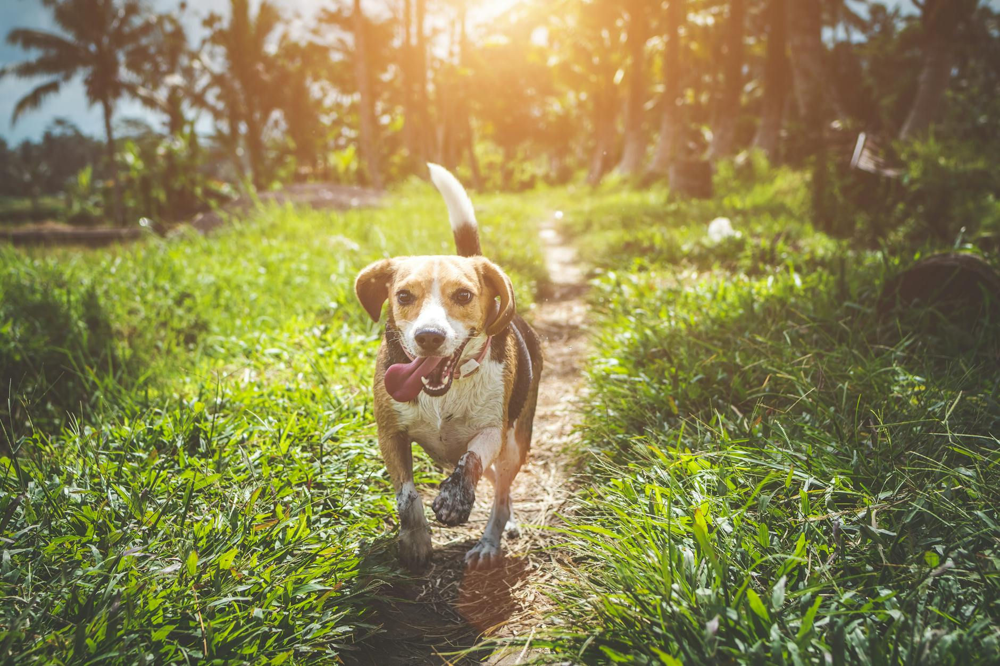



Tensor shape:
torch.Size([1, 3, 224, 224])


In [2]:
from PIL import Image
import requests

# 设置图片的URL
image_name = "pexels-photo-1485637.jpeg"
image_url = f"https://images.pexels.com/photos/1485637/{image_name}?auto=compress&cs=tinysrgb&dpr=2&h=650&w=940"

# 加载图片
image = Image.open(requests.get(image_url, stream=True).raw)
print("Image to be processed")
display(image)

# 预处理图像
image = preprocess(image).unsqueeze(0).to(device)
print("\n\nTensor shape:")
print(image.shape)

In [3]:
with torch.no_grad():
    image_features = model.encode_image(image)
print(image_features.shape)

torch.Size([1, 512])


In [5]:
text_snippets = ["a photo of a dog"]

# 预处理文本
text = clip.tokenize(text_snippets).to(device)
print(text.shape)

torch.Size([1, 77])


In [6]:
with torch.no_grad():
    text_features = model.encode_text(text)
print(text_features.shape)

In [93]:
# Normalize to unit vectors
text_features = text_features / text_features.norm(dim=-1, keepdim=True)
image_features = image_features / image_features.norm(dim=-1, keepdim=True)

# Cosine similarity
similarity = (image_features @ text_features.T)  # shape: [1, 1]
loss = -similarity[0, 0]
print("Label probs:", loss)

In [85]:
import os
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import re
def simplified_guided_sampler(
    model,
    latents,
    y,
    score_fn,
    processor,
    mllm_model,
    tokenizer,
    get_mllm_grad_norm_map,
    image_size=128,
    num_steps=20,
    reward_threshold=1.0,
    proposal_topk=3,
    langevin_interval=5,
    cfg_scale=1.0,
    guidance_low=0.0,
    guidance_high=1.0,
    init_noise_std=1e-2,
    langevin_step_size=0.05,
    langevin_noise_scale=0.01,
    chunk_size=16,
    return_intermediates=False,
):
    xts = [[] for _ in range(num_steps)]
    x0_preds = [[] for _ in range(num_steps)]
    all_rewards = [[] for _ in range(num_steps)]

    device = latents.device
    t_steps = torch.linspace(1, 0, num_steps + 1, dtype=torch.float64).to(device)
    _dtype = latents.dtype
    x_particles = latents.to(torch.float64)
    if init_noise_std > 0:
        x_particles += (torch.randn_like(x_particles) * init_noise_std).to(device)
    satisfied = torch.zeros(x_particles.size(0), dtype=torch.bool, device=device)

    save_dir = "./proposal_vis"
    os.makedirs(save_dir, exist_ok=True)

    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        print(f"\n🕓 Step {i+1}/{num_steps} | t: {t_cur:.4f} → {t_next:.4f}")

        x_cur = x_particles
        time_input = torch.ones(x_cur.size(0), device=device, dtype=torch.float64) * t_cur
        x_cur_ = x_cur.detach().requires_grad_(False) 
        d_cur = model(x_cur.to(dtype=_dtype), time_input.to(dtype=_dtype), y=y)[0].to(torch.float64)

        x_ddim = x_cur + (t_next - t_cur) * d_cur
        x0_pred = x_cur - t_cur * d_cur
        # print("x0_pred:",x0_pred)

        if (i + 1) % langevin_interval == 0 and not torch.all(satisfied):
            print(f"🔍 Interval step {i+1}, processing {torch.sum(~satisfied)} particles")

            current_rewards = []
            x_next_candidates = []

            for b in range(x_particles.size(0)):
                if satisfied[b]:
                    x_next_candidates.append(x_ddim[b:b+1])
                    current_rewards.append(reward_threshold)
                    continue

                proposals = []
                proposal_imgs = []
                for k in range(proposal_topk):
                    print(f"The {b}th particle, proposal {k}")
                    img_tensor = x0_pred[b:b+1]
                    xt_tensor = x_cur[b:b+1]
                    pil_img = TF.to_pil_image(torch.clamp((img_tensor[0] + 1)/2, 0, 1))
                    grad_map = get_mllm_grad_norm_map(image_input=pil_img,image_size=image_size, processor=processor, mllm_model=mllm_model, tokenizer=tokenizer)
                    proposal = langevin_step(xt_tensor, grad_map, step_size=langevin_step_size, noise_scale=langevin_noise_scale)
                    # print(f"The {b}th particle, proposal {k} the proposal is {proposal}")
                    print(f"The {b}th particle, proposal {k}")
                    proposals.append(proposal)
                    proposal_imgs.append(TF.to_pil_image(torch.clamp((proposal[0] + 1)/2, 0, 1)))

                # num_duplicates = 0
                # for m in range(len(proposals)):
                #     for n in range(m + 1, len(proposals)):
                #         if torch.allclose(proposals[m], proposals[n], atol=1e-6):
                #             print(f"⚠️ Duplicate found between proposal {m} and {n} for particle {b}")
                #             num_duplicates += 1
                # print(f"Total duplicates for particle {b}: {num_duplicates}")

                rewards = [score_fn(pil) for pil in proposal_imgs]
                best_idx = torch.tensor(rewards).argmax().item()
                print(f"✅ Selected proposal {best_idx} for particle {b}, reward={rewards[best_idx]:.2f}")

                # ✅ 保存可视化
                fig, axes = plt.subplots(1, proposal_topk, figsize=(4 * proposal_topk, 4))
                if proposal_topk == 1:
                    axes = [axes]
                for k, (img, reward) in enumerate(zip(proposal_imgs, rewards)):
                    axes[k].imshow(img)
                    axes[k].axis("off")
                    axes[k].set_title(
                        f"{'✓ ' if k == best_idx else ''}Proposal {k}\nScore: {reward:.2f}",
                        fontsize=12,
                        color="green" if k == best_idx else "black"
                    )
                plt.tight_layout()
                plt.savefig(os.path.join(save_dir, f"step{i+1:02d}_particle{b}_selected{best_idx}.png"))
                plt.close()

                x_next_candidates.append(proposals[best_idx])
                current_rewards.append(rewards[best_idx])

            current_rewards = torch.tensor(current_rewards, device=device)
            satisfied = satisfied | (current_rewards >= reward_threshold)
            x_particles = torch.cat(x_next_candidates, dim=0)

            all_rewards[i] = current_rewards.cpu().tolist()
        else:
            x_particles = x_ddim
            all_rewards[i] = [None] * x_particles.size(0)

        if return_intermediates:
            for p in range(x_particles.size(0)):
                xts[i].append(x_cur[p].detach().clone().to(torch.float32))
                x0_preds[i].append(x0_pred[p].detach().clone().to(torch.float32))

        if torch.all(satisfied):
            print("✅ All particles satisfied, skipping remaining steps")
            break

    if return_intermediates:
        return x_particles, xts, x0_preds, all_rewards
    return x_particles

In [86]:
from functools import partial

# 1. 随机初始化 latent
n = 1  # batch size
xT = torch.randn(n, 3, resolution, resolution, device=device)

# 2. 采样 latent 条件向量（使用 euler_sampler from original）
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)
sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)
with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化
B, C, H, W = quant.shape  
quant = quant.view(B, C, H * W).permute(0, 2, 1)

# 3. 定义 reward 函数
resolution = 64
score_fn = partial(mllm_score, image_size=resolution, model=mllm_model,processor = processor)

# 4. 执行 Derivative-guided 采样（新版本）
final_latents, xts, x0_preds, all_rewards = simplified_guided_sampler(
    model=vae.decoder,
    latents=xT,
    y=quant,
    score_fn=score_fn,
    processor=processor,
    mllm_model=mllm_model,
    tokenizer = tokenizer,
    get_mllm_grad_norm_map=get_mllm_grad_norm_map,
    image_size=resolution,
    num_steps=20,
    reward_threshold=1.0,
    proposal_topk=1,
    langevin_noise_scale=0.01,
    langevin_step_size=10,
    langevin_interval=5,  # ✅ 新增，每4步执行一次 Langevin 引导
    return_intermediates=True
)




🕓 Step 1/20 | t: 1.0000 → 0.9500

🕓 Step 2/20 | t: 0.9500 → 0.9000

🕓 Step 3/20 | t: 0.9000 → 0.8500

🕓 Step 4/20 | t: 0.8500 → 0.8000

🕓 Step 5/20 | t: 0.8000 → 0.7500
🔍 Interval step 5, processing 1 particles
The 0th particle, proposal 0
[MLLM Output] system
You are a helpful assistant.
user
You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score

In [66]:
all_rewards[4][0].shape

torch.Size([1, 256, 32])

In [77]:
import os
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import re

def simplified_guided_sampler(
    model,
    latents,
    y,
    score_fn,
    processor,
    mllm_model,
    tokenizer,
    get_mllm_grad_norm_map,
    image_size=128,
    num_steps=20,
    reward_threshold=1.0,
    proposal_topk=3,
    langevin_interval=5,
    cfg_scale=1.0,
    guidance_low=0.0,
    guidance_high=1.0,
    init_noise_std=1e-2,
    langevin_step_size=0.05,
    langevin_noise_scale=0.01,
    chunk_size=16,
    return_intermediates=False,
):
    xts = [[] for _ in range(num_steps)]
    x0_preds = [[] for _ in range(num_steps)]
    all_rewards = [[] for _ in range(num_steps)]
    y_grads = [[] for _ in range(num_steps)]  # <-- 存储每一步的 ∇_y loss

    device = latents.device
    _dtype = latents.dtype
    y = y.detach().clone().requires_grad_(True)  # <- 关键：开启 y 的梯度

    t_steps = torch.linspace(1, 0, num_steps + 1, dtype=torch.float64).to(device)
    x_particles = latents.to(torch.float64)
    if init_noise_std > 0:
        x_particles += (torch.randn_like(x_particles) * init_noise_std).to(device)
    satisfied = torch.zeros(x_particles.size(0), dtype=torch.bool, device=device)

    save_dir = "./proposal_vis"
    os.makedirs(save_dir, exist_ok=True)

    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        print(f"\n🕓 Step {i+1}/{num_steps} | t: {t_cur:.4f} → {t_next:.4f}")

        x_cur = x_particles
        time_input = torch.ones(x_cur.size(0), device=device, dtype=torch.float64) * t_cur
        d_cur = model(x_cur.to(dtype=_dtype), time_input.to(dtype=_dtype), y=y)[0].to(torch.float64)

        x_ddim = x_cur + (t_next - t_cur) * d_cur
        x0_pred = x_cur - t_cur * d_cur

        if (i + 1) % langevin_interval == 0 and not torch.all(satisfied):
            print(f"🔍 Interval step {i+1}, processing {torch.sum(~satisfied)} particles")

            current_rewards = []
            x_next_candidates = []

            for b in range(x_particles.size(0)):
                if satisfied[b]:
                    x_next_candidates.append(x_ddim[b:b+1])
                    current_rewards.append(reward_threshold)
                    continue

                proposals = []
                proposal_imgs = []
                grad_y_acc = []

                for k in range(proposal_topk):
                    print(f"The {b}th particle, proposal {k}")
                    img_tensor = x0_pred[b:b+1]  # 依赖于 y
                    pil_img = TF.to_pil_image(torch.clamp((img_tensor[0] + 1) / 2, 0, 1))

                    grad_map = get_mllm_grad_norm_map(
                        image_input=pil_img,
                        image_size=image_size,
                        processor=processor,
                        mllm_model=mllm_model,
                        tokenizer=tokenizer
                    ).to(device)

                    # 计算 ∇_y loss 通过链式法则
                    grad_y = torch.autograd.grad(
                        outputs=img_tensor,
                        inputs=y,
                        grad_outputs=grad_map,
                        retain_graph=True,
                        create_graph=True,
                        only_inputs=True,
                    )[0]
                    grad_y_acc.append(grad_y.detach().clone())  # 存储

                    # Langevin proposal
                    proposal = langevin_step(img_tensor, grad_map, step_size=langevin_step_size, noise_scale=langevin_noise_scale)
                    proposals.append(proposal)
                    proposal_imgs.append(TF.to_pil_image(torch.clamp((proposal[0] + 1) / 2, 0, 1)))

                rewards = [score_fn(pil) for pil in proposal_imgs]
                best_idx = torch.tensor(rewards).argmax().item()
                print(f"✅ Selected proposal {best_idx} for particle {b}, reward={rewards[best_idx]:.2f}")

                # 保存可视化
                fig, axes = plt.subplots(1, proposal_topk, figsize=(4 * proposal_topk, 4))
                if proposal_topk == 1:
                    axes = [axes]
                for k, (img, reward) in enumerate(zip(proposal_imgs, rewards)):
                    axes[k].imshow(img)
                    axes[k].axis("off")
                    axes[k].set_title(
                        f"{'✓ ' if k == best_idx else ''}Proposal {k}\nScore: {reward:.2f}",
                        fontsize=12,
                        color="green" if k == best_idx else "black"
                    )
                plt.tight_layout()
                plt.savefig(os.path.join(save_dir, f"step{i+1:02d}_particle{b}_selected{best_idx}.png"))
                plt.close()

                x_next_candidates.append(proposals[best_idx])
                current_rewards.append(rewards[best_idx])
                y_grads[i].append(grad_y_acc[best_idx])  # 记录该 particle 的 best grad_y

            current_rewards = torch.tensor(current_rewards, device=device)
            satisfied = satisfied | (current_rewards >= reward_threshold)
            x_particles = torch.cat(x_next_candidates, dim=0)

            all_rewards[i] = current_rewards.cpu().tolist()
        else:
            x_particles = x_ddim
            all_rewards[i] = [None] * x_particles.size(0)
            y_grads[i] = [None] * x_particles.size(0)

        if return_intermediates:
            for p in range(x_particles.size(0)):
                xts[i].append(x_cur[p].detach().clone().to(torch.float32))
                x0_preds[i].append(x0_pred[p].detach().clone().to(torch.float32))

        if torch.all(satisfied):
            print("✅ All particles satisfied, skipping remaining steps")
            break

    if return_intermediates:
        return x_particles, xts, x0_preds, y_grads
    return x_particles


tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]], device='cuda:1')

In [78]:
from functools import partial


quant_update = quant + 0.01*all_rewards[-1][0] 

# 3. 定义 reward 函数
resolution = 64
score_fn = partial(mllm_score, image_size=resolution, model=mllm_model,processor = processor)

# 4. 执行 Derivative-guided 采样（新版本）
final_latents, xts, x0_preds, all_rewards = simplified_guided_sampler(
    model=vae.decoder,
    latents=xT,
    y=quant_update,
    score_fn=score_fn,
    processor=processor,
    mllm_model=mllm_model,
    tokenizer = tokenizer,
    get_mllm_grad_norm_map=get_mllm_grad_norm_map,
    image_size=resolution,
    num_steps=20,
    reward_threshold=1.0,
    proposal_topk=1,
    langevin_noise_scale=0.01,
    langevin_step_size=10,
    langevin_interval=5,  # ✅ 新增，每4步执行一次 Langevin 引导
    return_intermediates=True
)




🕓 Step 1/20 | t: 1.0000 → 0.9500

🕓 Step 2/20 | t: 0.9500 → 0.9000

🕓 Step 3/20 | t: 0.9000 → 0.8500

🕓 Step 4/20 | t: 0.8500 → 0.8000

🕓 Step 5/20 | t: 0.8000 → 0.7500
🔍 Interval step 5, processing 1 particles
The 0th particle, proposal 0


[MLLM Output] system
You are a helpful assistant.
user
You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. If the score is 0, also output: The correct numbers should be {{n1, n2, n3, n4}}.
assistant
The digits are {{8, 5, 2, 9}}.

Now, let's calculate the differences between each pair of adjacent digits:
- 5 - 8 = -3


In [63]:
import os
import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from PIL import Image

def visualize_smc_sampling_steps(
    xts, x0_preds, rewards=None, save_dir=None,
    num_samples=3, particles_per_sample=2
):
    os.makedirs(save_dir, exist_ok=True)
    num_steps = len(xts)
    total_particles = num_samples * particles_per_sample

    for step in range(num_steps):
        # 如果该步没有 reward，就跳过显示 score
        has_reward = rewards is not None and len(rewards[step]) > 0

        fig, axs = plt.subplots(num_samples, particles_per_sample * 2, figsize=(particles_per_sample * 4.5, num_samples * 2.5))

        if num_samples == 1:
            axs = axs.reshape(1, -1)
        if particles_per_sample == 1:
            axs = axs.reshape(-1, 2)

        for s in range(num_samples):
            for p in range(particles_per_sample):
                idx = s * particles_per_sample + p
                xt = xts[step][idx]
                x0 = x0_preds[step][idx]

                xt_img = TF.to_pil_image(torch.clamp((xt + 1) / 2, 0, 1))
                x0_img = TF.to_pil_image(torch.clamp((x0 + 1) / 2, 0, 1))

                # x_t
                axs[s, p * 2].imshow(xt_img)
                axs[s, p * 2].axis('off')
                axs[s, p * 2].set_title(f"Sample {s} | P{p+1} x_t")

                # x_0_pred + reward
                axs[s, p * 2 + 1].imshow(x0_img)
                axs[s, p * 2 + 1].axis('off')

                if has_reward:
                    score = rewards[step][idx]
                    if score is not None:
                        score_text = f"Score: {score:.2f}"
                    else:
                        score_text = ""
                else:
                    score_text = ""
                axs[s, p * 2 + 1].set_title(f"Sample {s} | P{p+1} x₀\n{score_text}")

        plt.suptitle(f"SMC Sampling - Step {step + 1}", fontsize=14)
        plt.tight_layout()
        save_path = os.path.join(save_dir, f"all_samples_step_{step+1:02d}.png")
        plt.savefig(save_path)
        plt.close(fig)



In [64]:
# 5. 可视化
visualize_smc_sampling_steps(
    xts, x0_preds,
    rewards=all_rewards,
    save_dir="/cpfs04/user/hanyujin/rule-gen/rule_tokenizer/inference/sampling_steps_ori/jepaae_dereward_mnist",
    num_samples=min(n, 4),
    particles_per_sample=1
)


In [50]:
def get_mllm_loss(image_input,image_size, processor, mllm_model, tokenizer):
    import torch
    import torch.nn.functional as F
    import torchvision.transforms.functional as TF
    import numpy as np
    import re

    device = "cuda"
    # image_input = F.interpolate(image_input, size=(image_size, image_size), mode="bilinear", align_corners=False)
    # image_input = processor.image_processor(image_input, return_tensors="pt")["pixel_values"].to(device)
    # image_input.requires_grad = True
    # Step 1: 构建 MLLM prompt
    messages = [
        {
            "role": "user",
            "content": [
                {"type": "image", "image": image_input, "resized_height": image_size, "resized_width": image_size},
                {"type": "text", "text": (
                    "You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. "
                    # "First, extract the four digits in the order from top to bottom, then left to right (e.g., extract 0, 1, 2, 3). "
                    "First, extract the four digits in the order from top to bottom, then left to right. "
                    # "Next, calculate the difference between each pair of adjacent digits (i.e., check if 1 - 0 = 2 - 1 = 3 - 2 = 1). "
                    "Next, calculate the difference between each pair of adjacent digits. "
                    "If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. "
                    "Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. "
                    "Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. "
                    "If the score is 0, also output: The correct numbers should be {{n1, n2, n3, n4}}."
                )}
            ]
        }
    ]

    # Step 2: 构造 MLLM 输入
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    image_input, video_inputs = process_vision_info(messages)
    inputs = processor(text=[text], images=image_input, return_tensors="pt", padding=True).to(device)
    # print("input keys:", inputs.keys())
    # print("inputs['pixel_values'].shape:", inputs['pixel_values'].shape)
    # 构造 processor
    # text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    # dummy_pil = [Image.new("RGB", (image_size, image_size))]
    # inputs = processor(text=[text], images=dummy_pil, return_tensors="pt").to(device)
    # # 替换 pixel_values（保持梯度链）
    # inputs["pixel_values"] = image_input


    with torch.no_grad():
        response = mllm_model.generate(**inputs, max_new_tokens=256)
        decoded = processor.batch_decode(response, skip_special_tokens=True)[0]
        print(f"[MLLM Output] {decoded}")

    # Step 3: 提取 score 和 correct label
    pred_digits_match = re.findall(r'The digits are\s*[\{\[]*([\d,\s]+)[\}\]]*', decoded)
    score_match = re.search(r'The score is\s*\{{0,2}(\d+)\}{0,2}', decoded)
    correct_digits_match = re.findall(r'The correct numbers should be\s*[\{\[]*([\d,\s]+)[\}\]]*', decoded)

    if not score_match or not pred_digits_match:
        print("⚠️ 无法提取 score 或 prediction，返回零梯度")
        return 0,score

    score = int(score_match.group(1))
    if score == 1:
        print(f"[MLLM] Score = {score}，图像已正确，无需梯度")
        return 0,score

    if not correct_digits_match:
        print("⚠️ Score=0 但未能提取 correct digits，返回零梯度")
        return 0,score

    correct_digits = correct_digits_match[-1].strip()
    correct_text = f"The digits are {correct_digits}."

    # Step 5: 得到图像 + prompt 的预测 logits
    output_pred = mllm_model(**inputs, return_dict=True)
    logits_pred = output_pred.logits[:, -1, :]  # [B, vocab_size]
    print("false logits_pred:",logits_pred)
    # pred_class = torch.argmax(logits_pred, dim=1)

    # Step 6: 构造 "correct text" 的 tokenizer-only 输入（不含 image）
    target_input_ids = tokenizer(correct_text, return_tensors="pt").input_ids.to(device)
    output_correct = mllm_model(input_ids=target_input_ids, return_dict=True)
    logits_correct = output_correct.logits[:, -1, :]  # [B, vocab_size]
    print("correct logits_pred:",logits_correct)
    # Step 7: 构造 loss（比如 KL / MSE / cross-entropy）
    loss = F.mse_loss(logits_pred, logits_correct)
    print(f"[Loss] MSE between pred/correct logits: {loss.item():.4f}")

    return loss,score


In [53]:
import os
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
import re
def simplified_guided_sampler_y(
    model,
    latents,
    y,
    score_fn,
    processor,
    mllm_model,
    tokenizer,
    get_mllm_loss,
    image_size=128,
    num_steps=20,
    reward_threshold=1.0,
    proposal_topk=3,
    langevin_interval=5,
    cfg_scale=1.0,
    guidance_low=0.0,
    guidance_high=1.0,
    init_noise_std=1e-2,
    langevin_step_size=0.05,
    langevin_noise_scale=0.01,
    chunk_size=16,
    return_intermediates=False,
):
    xts = [[] for _ in range(num_steps)]
    x0_preds = [[] for _ in range(num_steps)]
    all_rewards = [[] for _ in range(num_steps)]
    y = y.detach().clone().requires_grad_(True)
    device = latents.device
    t_steps = torch.linspace(1, 0, num_steps + 1, dtype=torch.float64).to(device)
    _dtype = latents.dtype
    x_particles = latents.to(torch.float64)
    if init_noise_std > 0:
        x_particles += (torch.randn_like(x_particles) * init_noise_std).to(device)
    satisfied = torch.zeros(x_particles.size(0), dtype=torch.bool, device=device)

    save_dir = "./proposal_vis"
    os.makedirs(save_dir, exist_ok=True)

    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        print(f"\n🕓 Step {i+1}/{num_steps} | t: {t_cur:.4f} → {t_next:.4f}")

        x_cur = x_particles
        time_input = torch.ones(x_cur.size(0), device=device, dtype=torch.float64) * t_cur

        with torch.no_grad():
            d_cur = model(x_cur.to(dtype=_dtype), time_input.to(dtype=_dtype), y=y)[0].to(torch.float64)

        x_ddim = x_cur + (t_next - t_cur) * d_cur
        x0_pred = x_cur - t_cur * d_cur
        # print("x0_pred:",x0_pred)

        if (i + 1) % langevin_interval == 0 and not torch.all(satisfied):
            print(f"🔍 Interval step {i+1}, processing {torch.sum(~satisfied)} particles")

            current_rewards = []
            x_next_candidates = []

            for b in range(x_particles.size(0)):
                if satisfied[b]:
                    x_next_candidates.append(x_ddim[b:b+1])
                    current_rewards.append(reward_threshold)
                    continue

                proposals = []
                proposal_imgs = []
                grads = []
                for k in range(proposal_topk):
                    print(f"The {b}th particle, proposal {k}")
                    img_tensor = x0_pred[b:b+1]
                    pil_img = torch.clamp((img_tensor[0] + 1)/2, 0, 1) #TF.to_pil_image(torch.clamp((img_tensor[0] + 1)/2, 0, 1))
                    pil_img = TF.to_pil_image(torch.clamp((img_tensor[0] + 1)/2, 0, 1))
                    # pil_img= pil_img.detach().clone().requires_grad_(True)
                    mllm_loss,score = get_mllm_loss(image_input=pil_img,image_size=image_size, processor=processor, mllm_model=mllm_model, tokenizer=tokenizer)
                    if score ==0:
                        grad = torch.autograd.grad(mllm_loss, y, retain_graph=True)[0]  # [1, 3, H, W]
                        # print(f"The {b}th particle, proposal {k} the proposal is {proposal}")
                        grads.append(grad)
                    if score == 1:
                        # pil_img = TF.to_pil_image(pil_img)
                        plt.imshow(pil_img)
                        plt.axis("off")
                        plt.title("Generated Image")
                        plt.show()

                                        

        else:
            x_particles = x_ddim
            all_rewards[i] = [None] * x_particles.size(0)

        if return_intermediates:
            for p in range(x_particles.size(0)):
                xts[i].append(x_cur[p].detach().clone().to(torch.float32))
                x0_preds[i].append(x0_pred[p].detach().clone().to(torch.float32))

        if torch.all(satisfied):
            print("✅ All particles satisfied, skipping remaining steps")
            break

    if return_intermediates:
        return x_particles, xts, x0_preds, grads
    return x_particles



🕓 Step 1/20 | t: 1.0000 → 0.9500

🕓 Step 2/20 | t: 0.9500 → 0.9000

🕓 Step 3/20 | t: 0.9000 → 0.8500

🕓 Step 4/20 | t: 0.8500 → 0.8000

🕓 Step 5/20 | t: 0.8000 → 0.7500
🔍 Interval step 5, processing 1 particles
The 0th particle, proposal 0


[MLLM Output] system
You are a helpful assistant.
user
You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right. Next, calculate the difference between each pair of adjacent digits. If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. If the score is 0, also output: The correct numbers should be {{n1, n2, n3, n4}}.
assistant
The digits are {{3, 4, 5, 6}}.

Next, we calculate the differences between each pair of adjacent digits:
- The difference between 3 and 4 is \(4 - 3 = 1\).
- The difference between 4 and 5 i

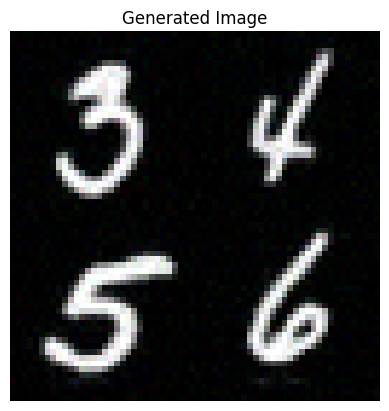


🕓 Step 6/20 | t: 0.7500 → 0.7000

🕓 Step 7/20 | t: 0.7000 → 0.6500

🕓 Step 8/20 | t: 0.6500 → 0.6000

🕓 Step 9/20 | t: 0.6000 → 0.5500

🕓 Step 10/20 | t: 0.5500 → 0.5000
🔍 Interval step 10, processing 1 particles
The 0th particle, proposal 0
[MLLM Output] system
You are a helpful assistant.
user
You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right. Next, calculate the difference between each pair of adjacent digits. If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. If the score is 0, also output: The cor

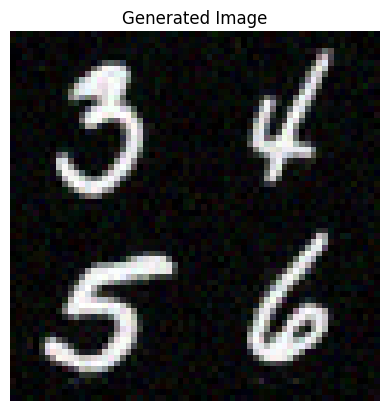


🕓 Step 11/20 | t: 0.5000 → 0.4500

🕓 Step 12/20 | t: 0.4500 → 0.4000

🕓 Step 13/20 | t: 0.4000 → 0.3500

🕓 Step 14/20 | t: 0.3500 → 0.3000

🕓 Step 15/20 | t: 0.3000 → 0.2500
🔍 Interval step 15, processing 1 particles
The 0th particle, proposal 0
[MLLM Output] system
You are a helpful assistant.
user
You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right. Next, calculate the difference between each pair of adjacent digits. If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. If the score is 0, also output: The

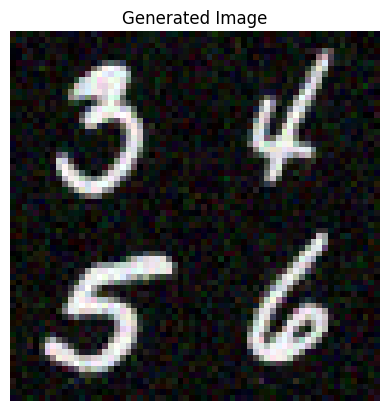


🕓 Step 16/20 | t: 0.2500 → 0.2000

🕓 Step 17/20 | t: 0.2000 → 0.1500

🕓 Step 18/20 | t: 0.1500 → 0.1000

🕓 Step 19/20 | t: 0.1000 → 0.0500

🕓 Step 20/20 | t: 0.0500 → 0.0000
🔍 Interval step 20, processing 1 particles
The 0th particle, proposal 0
[MLLM Output] system
You are a helpful assistant.
user
You are an expert in image understanding. You will be shown images featuring four digits arranged in a grid from top to bottom and left to right. First, extract the four digits in the order from top to bottom, then left to right. Next, calculate the difference between each pair of adjacent digits. If the differences between all adjacent digits are equal to 1, then the digits form an arithmetic sequence with a common difference of 1. Score 0 — The digits do not form such a sequence. Score 1 — The digits form a perfect sequence. Please first extract the digits in the format: The digits are {{n1, n2, n3, n4}}. Then give the score as: The score is {{score}}. If the score is 0, also output: The

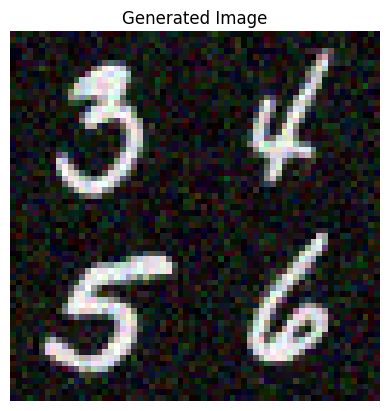

In [54]:
from functools import partial

# 1. 随机初始化 latent
n = 1  # batch size
xT = torch.randn(n, 3, resolution, resolution, device=device)

# 2. 采样 latent 条件向量（使用 euler_sampler from original）
quantT = torch.randn(n, vae_embed_dim, dit_input_size, dit_input_size, device=device)
sampling_kwargs_lat = dict(
    model=model,
    latents=quantT,
    y=torch.randint(0, num_classes, (n,), device=device),
    num_steps=num_steps,
    heun=False,
    cfg_scale=cfg_scale,
    guidance_low=guidance_low,
    guidance_high=guidance_high,
    path_type=path_type,
    num_classes=num_classes
)
with torch.no_grad():
    quant = euler_sampler(**sampling_kwargs_lat).to(torch.float32)
    quant = quant * vq_std + vq_mean  # 反归一化
B, C, H, W = quant.shape  
quant = quant.view(B, C, H * W).permute(0, 2, 1)

# 3. 定义 reward 函数
resolution = 64
score_fn = partial(mllm_score, image_size=resolution, model=mllm_model,processor = processor)

# 4. 执行 Derivative-guided 采样（新版本）
final_latents, xts, x0_preds, grads = simplified_guided_sampler_y(
    model=vae.decoder,
    latents=xT,
    y=quant,
    score_fn=score_fn,
    processor=processor,
    mllm_model=mllm_model,
    tokenizer = tokenizer,
    get_mllm_loss=get_mllm_loss,
    image_size=resolution,
    num_steps=20,
    reward_threshold=1.0,
    proposal_topk=1,
    langevin_noise_scale=0.01,
    langevin_step_size=10,
    langevin_interval=5,  # ✅ 新增，每4步执行一次 Langevin 引导
    return_intermediates=True
)
